In [1]:
## https://github.com/process-intelligence-solutions/pm4py/blob/release/notebooks/3_process_discovery.ipynb

In [2]:
import uuid
from IPython.display import display, HTML

def create_hide_button():
    unique_id = str(uuid.uuid4())
    display(HTML('''
        <script>
        function toggle_output(button_id) {
            var output_area = document.getElementById(button_id).parentElement.parentElement.nextElementSibling;
            var button = document.getElementById(button_id);
            if (output_area.style.display === "none") {
                output_area.style.display = "block";
                button.innerHTML = "Hide Output";
            } else {
                output_area.style.display = "none";
                button.innerHTML = "Show Output";
            }
        }
        </script>
    '''))

    button_id = f"button_{unique_id}"
    display(HTML(f'''
        <button id="{button_id}" onclick="toggle_output('{button_id}')">Show Output</button>
        <script>
            document.getElementById('{button_id}').parentElement.parentElement.nextElementSibling.style.display = 'none';
        </script>
    '''))

In [3]:
from IPython.display import display, HTML

display(HTML('''<style>
    .jp-CodeCell .jp-InputArea {display: none;} /* Hide only code cells */
</style>'''))

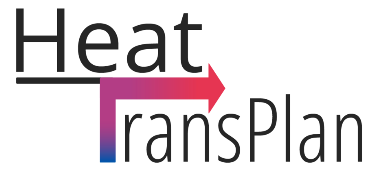


<div style="text-align: center; font-size: 50px;">
    <b>Exploratory Data Analysis</b>
</div>

In [4]:
import sys
sys.path.append('../')

import pandas as pd
import random
import itertools
import os
import numpy as np
from datetime import datetime, timedelta
import simpy
import seaborn as sns
import matplotlib.pyplot as plt
import chardet
import plotly.io as pio
from pathlib import Path

RANDOM_SEED = 42
random.seed(RANDOM_SEED)


pio.renderers.default='notebook'
pd.options.mode.chained_assignment = None

# Format of the Variables

In [5]:
# Define the path to the current file's location
current_path = Path(__file__).resolve().parent if '__file__' in globals() else Path().resolve()

files_folder = current_path.parent.parent.parent/ 'data' / 'bronze' / 'company_2'

files_folder

PosixPath('/Users/davidzapata/Documents/GitHub/process_energy_demand_modelling/data/bronze/company_2')

In [6]:
import pandas as pd
import chardet

pd.set_option('display.max_rows', 10)

# Process the first file
file1 = files_folder / "UNIP Erwärmen 11 2024.csv"

# Detect file encoding
with open(file1, "rb") as f:
    result1 = chardet.detect(f.read())
    print("Detected encoding for file1:", result1)

# Read the CSV file
df_raw1 = pd.read_csv(file1, sep=';', decimal=",", encoding=result1['encoding'])

print()
print("Initial DataFrame info for file1:")
print(df_raw1.info())
print()
print("Columns before dropping for file1:", df_raw1.columns.tolist())

# Identify columns to drop
columns_to_drop1 = [col for i, col in enumerate(df_raw1.columns) 
                    if "time" in col.lower() and i != 0]  # Keep the first column containing "time"

# Drop identified columns
df_raw1 = df_raw1.drop(columns=columns_to_drop1)

print()
print("Columns after dropping for file1:", df_raw1.columns.tolist())
print("Updated DataFrame info for file1:")

# Rename columns
df_raw1 = df_raw1.rename(columns={"Schritt L01 Time": "datetime"})
df_raw1 = df_raw1.rename(columns=lambda x: x.replace("ValueY", "")
                                        .replace(".", "")
                                        .replace(" ", "_")
                                        .lower())
df_raw1 = df_raw1.rename(columns={"menge_l01_":"pro_menge_l01_kg", "menge_l02_":"pro_menge_l02_kg", 
                                  "massenstrom_l01_": "pro_volstrom_l01_l/h", "massenstrom_l02_": "pro_volstrom_l02_l/h",
                                  "temp_l01_":"pro_temp_out_l01_", "temp_l02_":"pro_temp_out_l02_",
                                  "hw_l01_": "medium_temp_ein_l01", "hw_l02_": "medium_temp_ein_l02_"})


df_raw1 = df_raw1.dropna(subset=['datetime'])
df_raw1['datetime'] = pd.to_datetime(df_raw1['datetime'], format='%d.%m.%Y %H:%M:%S')

df_raw1['schritt_l01_'] = df_raw1['schritt_l01_'].astype(int)
df_raw1['schritt_l02_'] = df_raw1['schritt_l02_'].astype(int)

print()
#print(df_raw1.info())

# Copy the processed DataFrame
df_raw_process = df_raw1.copy()

# Process the second file
file2 = "/Users/davidzapata/Documents/git/heattransplan/data/raw/hipp/UNIP Dampf NMB+CIP + Schritte Turm und L01+L02.csv"

# Detect file encoding
with open(file2, "rb") as f:
    result2 = chardet.detect(f.read())
    print("Detected encoding for file2:", result2)

# Read the CSV file
df_raw2 = pd.read_csv(file2, sep=';', decimal=",", encoding=result2['encoding'])

print()
print("Initial DataFrame info for file2:")
#print(df_raw2.info())
print()
print("Columns before dropping for file2:", df_raw2.columns.tolist())

# Identify columns to drop
columns_to_drop2 = [col for i, col in enumerate(df_raw2.columns) 
                    if "time" in col.lower() and i != 0]  # Keep the first column containing "time"

# Drop identified columns
df_raw2 = df_raw2.drop(columns=columns_to_drop2)

print()
print("Columns after dropping for file2:", df_raw2.columns.tolist())
print("Updated DataFrame info for file2:")

# Rename columns
df_raw2 = df_raw2.rename(columns={"Dampfmenge kg/h NMB+Cip Time": "datetime"})
df_raw2 = df_raw2.rename(columns=lambda x: x.replace("ValueY", "")
                                        .replace(".", "")
                                        .replace(" ", "_")
                                        .lower())

df_raw2 = df_raw2.dropna(subset=['datetime'])
df_raw2['datetime'] = pd.to_datetime(df_raw2['datetime'], format='%d.%m.%Y %H:%M:%S')

# Copy the processed DataFrame
df_raw_second = df_raw2.copy()

# Merge the two DataFrames on the 'datetime' column
df_combined = df_raw_process.merge(df_raw_second, on='datetime', how='left')

df_combined = df_combined.drop(columns=['l01_schrit_prod_(dos)_', 'l02_schrit_prod_(dos)_'])

# Display the combined DataFrame
#df_combined

Detected encoding for file1: {'encoding': 'UTF-16', 'confidence': 1.0, 'language': ''}

Initial DataFrame info for file1:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368729 entries, 0 to 368728
Data columns (total 26 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Schritt L01 Time        368728 non-null  object 
 1   Schritt L01 ValueY      368728 non-null  float64
 2   Menge L01 Time          368728 non-null  object 
 3   Menge L01 ValueY        368728 non-null  float64
 4   Menge L02 Time          368728 non-null  object 
 5   Menge L02 ValueY        368728 non-null  float64
 6   Schritt L02 Time        368728 non-null  object 
 7   Schritt L02 ValueY      368728 non-null  float64
 8   Temp L01 Time           368728 non-null  object 
 9   Temp L01 ValueY         368728 non-null  float64
 10  Temp L02 Time           368728 non-null  object 
 11  Temp L02 ValueY         368728 non-null  float64
 12  Mat. I

## Legende

Daten:

Prozesse: Kombinierte Dosier- und Erhitzungslinien und High Shear Mixer

## L01

Produktionsmenge L01 (kg)

Temperatur Produkt L01 in (immer 4-6 Grad)

Temperatur Produkt L01 out

Volumenstrom Produkt L01 (l/h)

Betriebsstatus

## L02

Produktionsmenge L02 (kg)

Temperatur Produkt L02 in (immer 4-6 Grad)

Temperatur Produkt L02 out

Volumenstrom Produkt L02 (l/h)

Betriebsstatus



Rezept (nur in den 3 High Shear Mixer, die Linie 1 dosiert Magermilch und Linie 2 dosiert Magermilchkonzentrat in den Mixer)


# ETM 

Medium: Dampf

Temperatur ein (L01 und L02)

Temperatur aus (Über das Produkt berechnen)

Dampfmenge (kg/h) NMB+CIP (Von dem ganzen Nachmischbereich und CIP, die Betriebsstatus von CIP sind auch vorhanden)


In [7]:
pd.set_option('display.max_rows', 10)

# Specify file path
file = files_folder / "legende.csv"


# Read the CSV file
df_legend = pd.read_csv(file, sep=',', decimal=".")#, encoding=result['encoding'])

df_legend.columns = ['id_original', 'id', 'status']

#print(df_legend.info())
pd.set_option('display.max_rows', 20)
display(df_legend)

# Merge df_raw_process with df_legend on the specified columns
df_combined_legend = df_combined.merge(df_legend[['id', 'status']], left_on='schritt_l01_', right_on='id', how='left').rename(columns={
    'status': 'status_name_l01'
}).drop(columns='id')

df_combined_legend  = df_combined_legend.merge(df_legend[['id', 'status']], left_on='schritt_l02_', right_on='id', how='left').rename(columns={
    'status': 'status_name_l02'
}).drop(columns='id')

df_combined_legend  = df_combined_legend.replace('step', 'status')

display(df_combined_legend)

# Display the combined DataFrame
#df_combined_legend #.isna().sum()

,id_original,id,status
0,7613,0,Grundstellung
1,7614,3,Vorwärmen des Warmwasserkreislaufs
2,7615,4,Warten auf Ziel
3,13911,5,Warten auf Quelle
4,7617,7,Leitung zum Vorheizer füllen
5,7618,15,Leitung zum HSM füllen
6,7619,30,Produktion
7,7620,33,Nachlauf
8,14092,35,Pause Spülen
9,7621,40,Spülen mit Wasser


,datetime,schritt_l01_,pro_menge_l01_kg,pro_menge_l02_kg,schritt_l02_,pro_temp_out_l01_,pro_temp_out_l02_,mat_id_m01_,mat_id_m02_,mat_id_m03_,pro_volstrom_l01_l/h,pro_volstrom_l02_l/h,medium_temp_ein_l01,medium_temp_ein_l02_,dampfmenge_kg/h_nmb+cip_,cip_turm_f_,cip_turm_g_,status_name_l01,status_name_l02
0,2024-11-03 14:03:21,0,0.0,0.0,0,31.201172,29.909939,0,0,0,0.000000,0.0,33.582901,30.777994,574.001709,0,0,Grundstellung,Grundstellung
1,2024-11-03 14:03:26,0,0.0,0.0,0,31.201172,29.915365,0,0,0,0.000000,0.0,33.582901,30.777994,533.130798,0,0,Grundstellung,Grundstellung
2,2024-11-03 14:03:31,0,0.0,0.0,0,31.201172,29.909939,0,0,0,0.000000,0.0,33.582901,30.777994,497.685181,0,0,Grundstellung,Grundstellung
3,2024-11-03 14:03:36,0,0.0,0.0,0,31.201172,29.909939,0,0,0,0.000000,0.0,33.582901,30.772570,485.387726,0,0,Grundstellung,Grundstellung
4,2024-11-03 14:03:41,0,0.0,0.0,0,31.195747,29.909939,0,0,0,0.000000,0.0,33.582901,30.783421,498.408569,0,0,Grundstellung,Grundstellung
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368723,2024-11-24 22:10:16,0,0.0,0.0,0,63.677299,26.844618,0,0,0,15295.637695,0.0,69.238281,28.059896,3.978588,0,30,Grundstellung,Grundstellung
368724,2024-11-24 22:10:21,0,0.0,0.0,0,63.709854,26.844618,0,0,0,15455.648438,0.0,69.194878,28.054470,0.000000,0,30,Grundstellung,Grundstellung
368725,2024-11-24 22:10:26,0,0.0,0.0,0,63.736980,26.844618,0,0,0,15608.243164,0.0,69.135201,28.059896,0.000000,0,30,Grundstellung,Grundstellung
368726,2024-11-24 22:10:31,0,0.0,0.0,0,63.764107,26.833767,0,0,0,15756.002930,0.0,69.102646,28.054470,0.000000,0,30,Grundstellung,Grundstellung


In [8]:
df_combined_legend.columns

Index(['datetime', 'schritt_l01_', 'pro_menge_l01_kg', 'pro_menge_l02_kg',
       'schritt_l02_', 'pro_temp_out_l01_', 'pro_temp_out_l02_', 'mat_id_m01_',
       'mat_id_m02_', 'mat_id_m03_', 'pro_volstrom_l01_l/h',
       'pro_volstrom_l02_l/h', 'medium_temp_ein_l01', 'medium_temp_ein_l02_',
       'dampfmenge_kg/h_nmb+cip_', 'cip_turm_f_', 'cip_turm_g_',
       'status_name_l01', 'status_name_l02'],
      dtype='object')

In [9]:
# Assuming df_combined_legend is already defined in your notebook
# Get unique values for 'mat_id_m02_'
unique_mat_id_m01 = df_combined_legend['mat_id_m01_'].unique()
print("Unique values for 'mat_id_m01_':")
print(unique_mat_id_m01)


# Assuming df_combined_legend is already defined in your notebook
# Get unique values for 'mat_id_m02_'
unique_mat_id_m02 = df_combined_legend['mat_id_m02_'].unique()
print("Unique values for 'mat_id_m02_':")
print(unique_mat_id_m02)

# Get unique values for 'mat_id_m03_'
unique_mat_id_m03 = df_combined_legend['mat_id_m03_'].unique()
print("\nUnique values for 'mat_id_m03_':")
print(unique_mat_id_m03)

Unique values for 'mat_id_m01_':
[      0 8681981 8681982 8681983 8681588 8681697 8681590 8681592 8681607
 8842020 8842021 8842022]
Unique values for 'mat_id_m02_':
[      0 8681588 8681697 8681590 8681592 8681607]

Unique values for 'mat_id_m03_':
[      0 8681588 8681697 8681590 8681607]


In [10]:
df_combined_legend.columns

Index(['datetime', 'schritt_l01_', 'pro_menge_l01_kg', 'pro_menge_l02_kg',
       'schritt_l02_', 'pro_temp_out_l01_', 'pro_temp_out_l02_', 'mat_id_m01_',
       'mat_id_m02_', 'mat_id_m03_', 'pro_volstrom_l01_l/h',
       'pro_volstrom_l02_l/h', 'medium_temp_ein_l01', 'medium_temp_ein_l02_',
       'dampfmenge_kg/h_nmb+cip_', 'cip_turm_f_', 'cip_turm_g_',
       'status_name_l01', 'status_name_l02'],
      dtype='object')

In [11]:
import pandas as pd
import plotly.express as px

# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

# Filter to only include data from 2024-11-06
df = df[df['datetime'].dt.date == pd.to_datetime('2024-11-06').date()]

# Select the columns to analyze
schritt_cols = ['schritt_l01_', 'schritt_l02_']
mat_cols = ['mat_id_m01_', 'mat_id_m02_', 'mat_id_m03_']

# Function to get segments of constant values
def get_segments(df, column, status_col=None):
    segments = []
    current_value = None
    current_status = None
    start_time = None
    for idx, row in df.iterrows():
        if pd.isna(current_value) or row[column] != current_value:
            if current_value is not None and not pd.isna(current_value):
                segments.append({'start': start_time, 'end': row['datetime'], 'value': current_value, 'status': current_status})
            current_value = row[column]
            current_status = row[status_col] if status_col else None
            start_time = row['datetime']
    if current_value is not None and not pd.isna(current_value):
        segments.append({'start': start_time, 'end': df['datetime'].iloc[-1], 'value': current_value, 'status': current_status})
    return segments

# Collect all segments
segments_list = []
for col in schritt_cols:
    status_col = 'status_name_l01' if 'l01' in col else 'status_name_l02'
    segments = get_segments(df, col, status_col)
    for seg in segments:
        segments_list.append({
            'Task': col,
            'Start': seg['start'],
            'Finish': seg['end'],
            'Value': seg['status']
        })

for col in mat_cols:
    segments = get_segments(df, col)
    for seg in segments:
        segments_list.append({
            'Task': col,
            'Start': seg['start'],
            'Finish': seg['end'],
            'Value': str(seg['value'])
        })

segments_df = pd.DataFrame(segments_list)

# Create a Plotly timeline (Gantt chart)
fig = px.timeline(segments_df, x_start="Start", x_end="Finish", y="Task", color="Value",
                  title='Process Steps Timeline for 2024-11-06')

# Update layout
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Process Step',
    legend_title='Value'
)

# Show the plot
fig.show()

In [12]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Suppress the specific FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

def visualize_data(df, datetime_col, hover_cols=None, viz_hover=False, library="plotly"):
    """
    Visualize each variable in a DataFrame with descriptive stats, histogram, and linechart.
    
    Parameters:
    - df: pandas DataFrame
    - datetime_col: column name for datetime values
    - hover_cols: list of column names to include in hover data (for Plotly)
    - viz_hover: boolean to determine whether to visualize hover columns
    - library: visualization library to use ('plotly' or 'seaborn')
    """
    # Ensure the datetime column is in datetime format
    df[datetime_col] = pd.to_datetime(df[datetime_col])

    # Set Seaborn theme
    sns.set_theme(style="whitegrid", context="talk")

    # Determine columns to plot
    columns_to_plot = df.columns.difference(hover_cols) if not viz_hover and hover_cols else df.columns

    for col in columns_to_plot:
        if col == datetime_col:
            continue  # Skip the datetime column

        print(f"Variable: {col}")
        desc = df[col].describe().to_frame().T  # Convert describe output to DataFrame and transpose
        desc['unique'] = df[col].nunique()  # Add unique values count to the describe output
        display(desc)

        if library == "plotly":
            # Plotly Histograms
            fig_hist = px.histogram(df, x=col, title=f"Histogram of {col}")
            fig_hist.update_layout(width=1400, height=500)
            fig_hist.show()

            # Plotly Line Chart
            fig_line = px.line(df, x=datetime_col, y=col, title=f"{col}", hover_data=hover_cols)
            fig_line.update_layout(width=1400, height=500)
            fig_line.show()

        elif library == "seaborn":
            # Seaborn Histogram
            plt.figure(figsize=(20, 6))
            sns.histplot(df[col], kde=True, bins=30, color="green", edgecolor="black")
            plt.title(f"Histogram of {col}", fontsize=16)
            plt.xlabel(col, fontsize=14)
            plt.ylabel("Frequency", fontsize=14)
            plt.show()

            # Seaborn Line Chart
            plt.figure(figsize=(20, 6))
            sns.lineplot(data=df, x=datetime_col, y=col, color="green", linewidth=2.5)
            plt.title(f"{col} Over Time", fontsize=16)
            plt.xlabel("Datetime", fontsize=14)
            plt.ylabel(col, fontsize=14)
            plt.xticks(rotation=45, fontsize=12)
            plt.yticks(fontsize=12)
            plt.tight_layout()
            plt.show()


        # Print a horizontal line
        print("\u2500" * 220)

# Example usage
# df = pd.read_csv("your_data.csv")  # Load your dataframe here
# visualize_data(df, datetime_col="your_datetime_column", hover_cols=["col1", "col2"], viz_hover=False, library="plotly")

In [13]:
df = df_combined_legend.copy()

# Constants for l01 Magermilch
rho = 1.036  # Density of milk in kg/dm³
c = 3.95  # Specific heat capacity of milk in kJ/(kg·K)
T_in = 5  # Input temperature in °C

df = df[df['pro_volstrom_l01_l/h'] >= 0 ]
df = df[df['pro_volstrom_l02_l/h'] >= 0 ]

# Calculate the power required in kW
df['pro_power_kW_l01'] = ((df['pro_volstrom_l01_l/h'] * rho) * c * (df['pro_temp_out_l01_'] - T_in))  / 3600 # Power in kJ/h to kW

#display(df[['pro_volstrom_l01_l/h', 'pro_temp_out_l01_', 'pro_power_kW_l01']])

# Constants for l02 Magermilch Konzentrat
rho = 1.05  
c = 3.8

# Calculate the power required in kW
df['pro_power_kW_l02'] = ((df['pro_volstrom_l02_l/h'] * rho) * c * (df['pro_temp_out_l02_'] - T_in))  / 3600 # Power in kJ/h to kW

df[['pro_volstrom_l02_l/h', 'pro_temp_out_l02_', 'pro_power_kW_l01']]




################## Steam power calculation ##################
h = 2100 # kJ/kg

# Q (kw) = (massflow * condensation enthalpy)/ 3600
# Calculate the power required in kW
#df['dampfmenge_kg/h_nmb+cip_'] = (df['dampfmenge_kg/h_nmb+cip_'])#/ 1000
df['medium_power_kW'] = (df['dampfmenge_kg/h_nmb+cip_'] * h)/ 3600

# Steam in ton/s????

df_combined_legend = df.copy()

In [14]:
#### The variables are resampled per hour
pd.set_option('display.max_rows', 10)

all_columns = df_combined_legend.columns

# Define columns to aggregate with 'first'
first_columns = ['schritt_l01_', 'schritt_l02_', 'mat_id_m01_', 'mat_id_m02_', 'mat_id_m03_', 'status_name_l01', 'status_name_l02']

# Define columns to aggregate with 'sum'
sum_columns = ['pro_menge_l01_kg', 'pro_menge_l02_kg']

# Define columns to aggregate with 'mean' (all others not in first_columns or sum_columns)
mean_columns = [col for col in all_columns if col not in first_columns + sum_columns]

# Create a dictionary for aggregation methods
agg_dict = {col: 'mean' for col in mean_columns}
agg_dict.update({col: 'first' for col in first_columns})
agg_dict.update({col: 'sum' for col in sum_columns})  # Sum aggregation for specific columns

# Resample by 5 minutes and apply custom aggregation
df_resampled_1min = df_combined_legend.resample('min', on='datetime').agg(agg_dict).reset_index(drop=True)

#df_resampled_5_min

# Visualization for a day of important variables

In [15]:
import pandas as pd
from IPython.display import display

# Assuming df_legend is already defined
# Set display options to show all rows
#pd.set_option('display.max_rows', None)

relevant_columns = ['datetime', 'pro_volstrom_l01_l/h',  'pro_temp_out_l01_', 'medium_temp_ein_l01', 'pro_volstrom_l02_l/h', 'pro_temp_out_l02_',  'medium_temp_ein_l02_','dampfmenge_kg/h_nmb+cip_', 'status_name_l01', 'status_name_l02']

df = df_resampled_1min[relevant_columns].copy()
#df = df_combined_legend[relevant_columns].copy()

# Define the date range with hours
day_start = '2024-11-15 08:00:00'
day_end = '2024-11-15 18:00:00'

# Ensure the datetime column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# Filter the DataFrame for the specified date range
df= df[(df['datetime'] >= pd.to_datetime(day_start)) & 
                 (df['datetime'] < pd.to_datetime(day_end))]


df_l1 = df[['datetime', 'pro_volstrom_l01_l/h',  'pro_temp_out_l01_', 'medium_temp_ein_l01', 'status_name_l01']]
visualize_data(df_l1, datetime_col = 'datetime', hover_cols=['status_name_l01'], viz_hover=True, library="plotly")


df_l2 = df[['datetime', 'pro_volstrom_l02_l/h', 'pro_temp_out_l02_',  'status_name_l02', 'dampfmenge_kg/h_nmb+cip_', 'medium_temp_ein_l02_',]]
visualize_data(df_l2, datetime_col = 'datetime', hover_cols=['status_name_l02'], viz_hover=True, library="plotly")
# Reset display options if needed
# pd.reset_option('display.max_rows')

Variable: pro_volstrom_l01_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l01_l/h,600.0,2615.528788,6143.391534,0.0,0.0,0.0,0.0,23394.088379,105


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_temp_out_l01_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l01_,600.0,54.497249,8.919842,14.869068,53.100134,55.899161,58.873042,78.850189,600


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l01


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l01,600.0,50.148154,8.179351,37.877514,45.547711,48.61631,52.358556,77.426938,599


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l01


,count,unique,top,freq
status_name_l01,600,9,Warten auf Ziel,396


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_volstrom_l02_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l02_l/h,600.0,1152.153977,3985.712915,0.0,0.0,0.0,0.0,21310.323568,63


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_temp_out_l02_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l02_,600.0,66.49234,14.482902,15.60149,64.898004,69.97658,76.119091,83.0693,600


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l02


,count,unique,top,freq
status_name_l02,600,10,Warten auf Ziel,441


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: dampfmenge_kg/h_nmb+cip_


,count,mean,std,min,25%,50%,75%,max,unique
dampfmenge_kg/h_nmb+cip_,600.0,366.500138,538.425455,0.0,0.0,0.0,621.511201,2203.173197,282


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l02_


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l02_,600.0,66.318952,9.468982,35.671659,64.11777,68.507894,73.270105,81.32912,599


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Fragen:

- Theoretisch nur Volumenstrom im Status "Produktion"?
- Was ist die Grundstellung?
- Temperatur des Mediums am Eingang?
- Sind die Einheiten des Volumenstroms des Dampfes richtig?
- Negativer Volumenstrom?

# Calculation Power

Q = 𝑚˙ * cp * (T2 - T1)

Q = (v * rho) * cp * (T2-T1)

Von Q(kJ/h) to Q(kw) = Q(kJ/h)/3600

L01 Magermilch:
- rho = 1.036  # dichte Margermilch in kg/dm³
- cp = 3.95  # Spezifische Wärmekapazität kJ/(kg·K)
- T_in = 5  # Temepratur von Produkt in °C
- Calculation: df['pro_power_kW_l01'] = (df['pro_volstrom_l01_l/h'] * rho) * c * (df['pro_temp_out_l01_'] - T_in)  / 3600 # Power in kJ/h to kW

L02 Magermilchkonzentrat:
- rho = 1.05  
- cp = 3.8
- T_in = 5



In [16]:
import pandas as pd
from IPython.display import display

# Assuming df_legend is already defined
# Set display options to show all rows
#pd.set_option('display.max_rows', None)

relevant_columns = ['datetime', 'pro_power_kW_l01', 'pro_power_kW_l02', 'status_name_l01', 'status_name_l02']

df = df_resampled_1min[relevant_columns].copy()
#df = df_combined_legend[relevant_columns].copy()

# Define the date range with hours
day_start = '2024-11-15 08:00:00'
day_end = '2024-11-15 18:00:00'

# Ensure the datetime column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# Filter the DataFrame for the specified date range
df= df[(df['datetime'] >= pd.to_datetime(day_start)) & 
                 (df['datetime'] < pd.to_datetime(day_end))]


df_l1 = df[['datetime', 'pro_power_kW_l01', 'status_name_l01']]
visualize_data(df_l1, datetime_col = 'datetime', hover_cols=['status_name_l01'], viz_hover=False, library="plotly")


df_l2 = df[['datetime', 'pro_power_kW_l02', 'status_name_l02']]
visualize_data(df_l2, datetime_col = 'datetime', hover_cols=['status_name_l02'], viz_hover=False, library="plotly")
# Reset display options if needed
# pd.reset_option('display.max_rows')

Variable: pro_power_kW_l01


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l01,600.0,163.840072,400.860311,0.0,0.0,0.0,0.0,1533.780333,105


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_power_kW_l02


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l02,600.0,75.74802,273.863294,0.0,0.0,0.0,0.0,1750.275974,63


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Frage:
- Passt die Leistung in der Größenordnung?

# Calculation Power from Steam

#### Dampf für den ganzen Nachmischbereich und CIP

h = 2100 # kJ/kg

Berechnung der Leistung
Q (kW) = (Massenstrom * Kondensationsenthalpie) / 3600


In [17]:
import pandas as pd
from IPython.display import display

# Assuming df_legend is already defined
# Set display options to show all rows
#pd.set_option('display.max_rows', None)

relevant_columns = ['datetime', 'dampfmenge_kg/h_nmb+cip_', 'medium_power_kW']

df = df_resampled_1min[relevant_columns].copy()
#df = df_combined_legend[relevant_columns].copy()

# Define the date range with hours
day_start = '2024-11-15 08:00:00'
day_end = '2024-11-15 18:00:00'

# Ensure the datetime column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# Filter the DataFrame for the specified date range
df= df[(df['datetime'] >= pd.to_datetime(day_start)) & 
                 (df['datetime'] < pd.to_datetime(day_end))]

visualize_data(df, datetime_col = 'datetime', viz_hover=False, library="plotly")

# Reset display options if needed
# pd.reset_option('display.max_rows')

Variable: dampfmenge_kg/h_nmb+cip_


,count,mean,std,min,25%,50%,75%,max,unique
dampfmenge_kg/h_nmb+cip_,600.0,366.500138,538.425455,0.0,0.0,0.0,621.511201,2203.173197,282


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_power_kW


,count,mean,std,min,25%,50%,75%,max,unique
medium_power_kW,600.0,213.791747,314.081515,0.0,0.0,0.0,362.548201,1285.184365,282


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Fragen:

- Die Dampfleistung ist im Verhältnis zum Produktionsleistungsbedarf sehr niedrig. Sind die Dampfeinheiten korrekt?

In [18]:
import pandas as pd
import plotly.express as px

relevant_columns = ['datetime', 'dampfmenge_kg/h_nmb+cip_', 'medium_power_kW', 'pro_power_kW_l01', 'pro_power_kW_l02']


df = df_resampled_1min[relevant_columns].copy()

# Define the date range with hours
day_start = '2024-11-15 08:00:00'
day_end = '2024-11-15 18:00:00'

# Ensure the datetime column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# Filter the DataFrame for the specified date range
df= df[(df['datetime'] >= pd.to_datetime(day_start)) & 
                 (df['datetime'] < pd.to_datetime(day_end))]

# Assuming 'df' is your DataFrame
# Ensure the 'datetime' column is of type datetime
df['datetime'] = pd.to_datetime(df['datetime'])

# Exclude non-numeric columns for plotting
numeric_columns = df.select_dtypes(include=[float, int]).columns

# Create the Plotly figure
fig = px.line(df, x='datetime', y=numeric_columns,
              labels={col: col for col in numeric_columns},
              title='Interactive Visualization of Variables')

# Update layout to make columns clickable
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Value',
    legend_title='Variables',
    hovermode='x unified',
)

# Show the plot
fig.show()

- [Index](#Index)

# Get the weather

Wetterdaten vom Wetterdienst für den Standort abfragen und mit den Prozessdaten verknüpfen.

In [19]:

# # Copy original DataFrame
# df = df_combined_legend.copy()

# file_path = "/Users/davidzapata/Documents/git/heattransplan/data/raw/hipp/weather1.csv"

# getweather = True

# if getweather == True:
#     # Define latitude, longitude, and date range from hipp
#     latitude = 52.10873616116998
#     longitude = 8.654352922546678
#     start_date = df['datetime'].min().strftime('%Y-%m-%d')
#     end_date = df['datetime'].max().strftime('%Y-%m-%d')

#     # Fetch weather data
#     df_weather = get_weather(start_date, end_date, latitude, longitude)

#     # Save the weather data to the CSV file
#     df_weather.to_csv(file_path, index=False)
# else: 

#     # Load the data back
#     df_weather = pd.read_csv(file_path)

# # Display loaded data
# df_weather

# Aggregated Dataset per Hour

In [20]:
#### The variables are resampled per hour
pd.set_option('display.max_rows', 10)

all_columns = df_combined_legend.columns

# Define columns to aggregate with 'first'
first_columns = ['schritt_l01_', 'schritt_l02_', 'mat_id_m01_', 'mat_id_m02_', 'mat_id_m03_', 'status_name_l01', 'status_name_l02']

# Define columns to aggregate with 'sum'
sum_columns = ['pro_menge_l01_kg', 'pro_menge_l02_kg']

# Define columns to aggregate with 'mean' (all others not in first_columns or sum_columns)
mean_columns = [col for col in all_columns if col not in first_columns + sum_columns]

# Create a dictionary for aggregation methods
agg_dict = {col: 'mean' for col in mean_columns}
agg_dict.update({col: 'first' for col in first_columns})
agg_dict.update({col: 'sum' for col in sum_columns})  # Sum aggregation for specific columns

# Resample by 5 minutes and apply custom aggregation
df_resampled_5_min = df_combined_legend.resample('5min', on='datetime').agg(agg_dict).reset_index(drop=True)

#df_resampled_5_min

In [21]:
#### The variables are resampled per hour
pd.set_option('display.max_rows', 10)

all_columns = df_combined_legend.columns

# Define columns to aggregate with 'first'
first_columns = ['schritt_l01_', 'schritt_l02_', 'mat_id_m01_', 'mat_id_m02_', 'mat_id_m03_', 'status_name_l01', 'status_name_l02']

# Define columns to aggregate with 'sum'
sum_columns = ['pro_menge_l01_kg', 'pro_menge_l02_kg']

# Define columns to aggregate with 'mean' (all others not in first_columns or sum_columns)
mean_columns = [col for col in all_columns if col not in first_columns + sum_columns]

# Create a dictionary for aggregation methods
agg_dict = {col: 'mean' for col in mean_columns}
agg_dict.update({col: 'first' for col in first_columns})
agg_dict.update({col: 'sum' for col in sum_columns})  # Sum aggregation for specific columns

# Resample by 5 minutes and apply custom aggregation
df_resampled_1H = df_combined_legend.resample('h', on='datetime').agg(agg_dict).reset_index(drop=True)

df_resampled_1H['datetime'] = pd.to_datetime(df_resampled_1H['datetime']).dt.floor('h')

#df_resampled_1H

In [22]:
df = df_resampled_1H.copy()

df['datetime'] = pd.to_datetime(df['datetime'])

# Ensure the timestamp_utc column is in datetime format
# df_weather['timestamp_utc'] = pd.to_datetime(df_weather['timestamp_utc'])

df_resampled_1H_weather = df.copy()#pd.merge(df, df_weather, 
#                            left_on='datetime', 
#                            right_on='timestamp_utc', 
#                            how='left')

# Display the result
#df_resampled_1H_weather#.isna().sum()

### Aggregierte Datensätze pro Stunde mit Wetterdaten -> 513 Produktionsstunden insgesamt mit Wetterdaten (Außentemperatur, Sonneneinstrahlung, Niederschlag, Windgeschwindigkeit)

# Visualize the all the variables together for one day in min aggregation

Auf die Legende klicken, um einzelne Variablen auszuwählen.

In [23]:
import pandas as pd
import plotly.express as px

df = df_resampled_1min.copy()

# Define the date range with hours
day_start = '2024-11-15 08:00:00'
day_end = '2024-11-15 18:00:00'

# Ensure the datetime column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# Filter the DataFrame for the specified date range
df= df[(df['datetime'] >= pd.to_datetime(day_start)) & 
                 (df['datetime'] < pd.to_datetime(day_end))]

single_day = '2024-11-15'  # Replace with the desired date
df['datetime'] = pd.to_datetime(df['datetime'])  # Ensure the datetime column is in datetime format
df = df[df['datetime'].dt.date == pd.to_datetime(single_day).date()]

# Assuming 'df' is your DataFrame
# Ensure the 'datetime' column is of type datetime
df['datetime'] = pd.to_datetime(df['datetime'])

# Exclude non-numeric columns for plotting
numeric_columns = df.select_dtypes(include=[float, int]).columns

# Create the Plotly figure
fig = px.line(df, x='datetime', y=numeric_columns,
              labels={col: col for col in numeric_columns},
              title='Interactive Visualization of Variables')

# Update layout to make columns clickable
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Value',
    legend_title='Variables',
    hovermode='x unified',
)

# Show the plot
fig.show()

Fragen:

- Ist die Dosierungsreihenfolge richtig? (Variable pro_voltrom_l01 und pro_voltrom_l02 anklicken). Zuerst wird über L01 Magermilch dosiert und danach über L02 Magermilchkonzentrat, aber die sehen anders rum aus. Richtige Bennenung?
- L01 hat mehr Volumenstrom als L02

# Visualize the all the variables together per hour

Auf die Legende klicken, um einzelne Variablen auszuwählen.

In [24]:
import pandas as pd
import plotly.express as px

df = df_resampled_1H_weather.copy()

# Assuming 'df' is your DataFrame
# Ensure the 'datetime' column is of type datetime
df['datetime'] = pd.to_datetime(df['datetime'])

# Exclude non-numeric columns for plotting
numeric_columns = df.select_dtypes(include=[float, int]).columns

# Create the Plotly figure
fig = px.line(df, x='datetime', y=numeric_columns,
              labels={col: col for col in numeric_columns},
              title='Interactive Visualization of Variables')

# Update layout to make columns clickable
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Value',
    legend_title='Variables',
    hovermode='x unified',
)

# Show the plot
fig.show()

- [Index](#Index)

# Visualize the all the variables together scaling them from 0 to 1

Auf die Legende klicken, um einzelne Variablen auszuwählen.

In [25]:
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

# Assuming 'df_resampled_1H' is your original DataFrame
df = df_resampled_1H_weather.copy()

# Select only numeric columns for scaling, excluding 'datetime'
columns_to_scale = df.select_dtypes(include=[float, int]).columns

# Scale the variables to the range [0, 1]
scaler = MinMaxScaler()
df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

# Create the Plotly figure
fig = px.line(df, x='datetime', y=columns_to_scale,
              labels={col: col for col in columns_to_scale},
              title='Interactive Visualization of Scaled Variables',
              hover_data={'status_name_l01': True, 'status_name_l02': True})

# Update layout to make columns clickable
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Scaled Value',
    legend_title='Variables',
    hovermode='x unified',
)

# Show the plot
fig.show()

# Correlation matrix

In [26]:
import pandas as pd
import plotly.express as px

# relevant_columns = ['pro_temp_out_l01_', 'pro_temp_out_l02_',
#        'pro_volstrom_l01_l/h', 'pro_volstrom_l02_l/h', 'medium_temp_ein_l01',
#        'medium_temp_ein_l02_', 'dampfmenge_kg/h_nmb+cip_', 'pro_power_kW_l01', 'pro_power_kW_l02',
#        'temperature_2m', 'relative_humidity_2m', 'apparent_temperature',
#        'precipitation', 'wind_speed_10m', 'wind_direction_100m', 'medium_power_kW',
#        'global_tilted_irradiance']

relevant_columns = ['pro_temp_out_l01_', 'pro_temp_out_l02_',
       'pro_volstrom_l01_l/h', 'pro_volstrom_l02_l/h', 'medium_temp_ein_l01',
       'medium_temp_ein_l02_', 'dampfmenge_kg/h_nmb+cip_', 'pro_power_kW_l01', 'pro_power_kW_l02',
       #'temperature_2m', 'relative_humidity_2m', 'apparent_temperature',
       #'precipitation', 'wind_speed_10m', 'wind_direction_100m', 'global_tilted_irradiance'
       'medium_power_kW',
       ]

# Assuming df_resampled is already defined and contains your data
df = df_resampled_1H_weather.copy()

df = df[relevant_columns]

# Exclude non-numeric columns
numeric_df = df.select_dtypes(include=[float, int])

# state 1: Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# state 2: Plot the heatmap using Plotly
fig = px.imshow(corr_matrix, 
                text_auto=".1f",  # Round the correlation coefficients to one decimal place
                color_continuous_scale='RdBu',  # Red to blue color scale
                labels=dict(x="Variables", y="Variables", color="Correlation"),
                title="Correlation Matrix Heatmap",
                width=800,  # Increase the width
                height=800)  # Increase the height


#print(' Correlation for 1 hour span')
# state 3: Show the plot
fig.show()



- Starke Korrelationen (starke Farben Blau oder Rot) passen zum Prozess (z.B. wenn die Temperatur des Mediums steigt, steigt auch die Temperatur des Produkts).
- Es gibt zwei negative Korrelationen zwischen Wetterdaten und Prozessdaten (Außentemperatur und Windgeschwindigkeit). Wenn die Außentemperatur niedrig ist, steigt die Temperatur des Mediums und die Temperatur des Produktes. Dies ist wahrscheinlich eine Scheinkorrelation, da das Wetter das Produkt nicht beeinflussen sollte.

# Process Mining

In [27]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming df_resampled_1min is already defined
process_df = df_resampled_1min[['datetime', 'status_name_l01', 'status_name_l02']].reset_index()

# Count the number of minutes each status was activated
status_counts_l01 = process_df['status_name_l01'].value_counts()
status_counts_l02 = process_df['status_name_l02'].value_counts()

# Convert minutes to hours
status_counts_l01_hours = status_counts_l01 / 60
status_counts_l02_hours = status_counts_l02 / 60

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=('Minutes each status was activated (L01)', 'Minutes each status was activated (L02)'))

# Plot for status_name_l01
fig.add_trace(
    go.Bar(
        x=status_counts_l01.index, 
        y=status_counts_l01.values, 
        name='L01',
        hovertemplate='Status: %{x}<br>Minutes: %{y}<br>Hours: %{customdata:.2f}<extra></extra>',
        customdata=status_counts_l01_hours.values
    ),
    row=1, col=1
)

# Plot for status_name_l02
fig.add_trace(
    go.Bar(
        x=status_counts_l02.index, 
        y=status_counts_l02.values, 
        name='L02',
        hovertemplate='Status: %{x}<br>Minutes: %{y}<br>Hours: %{customdata:.2f}<extra></extra>',
        customdata=status_counts_l02_hours.values
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title_text='Minutes each status was activated',
    xaxis_title='Status',
    yaxis_title='Minutes',
    showlegend=False
)

fig.show()

03-11-24 bis 24-11-2024. Process Discovery mit Maschinestatus: Es ist nicht möglich, den Prozessstatus in L01 und L02 sowie die Materialnummer vom High Shear Mixer zuzuweisen. Die Zahlen stellen die Übergänge von einem Maschinenzustand zum anderen dar (Linien) und neben dem Status steht, wie oft dieser Zustand aktiviert wurde.

In [28]:
df1 = df_combined_legend[['datetime', 'status_name_l01']].reset_index()
df1['index'] = 1
df1 = df1[['datetime', 'status_name_l01', 'index']]
df1.columns = ['timestamp', 'activity', 'case_id']

df1

,timestamp,activity,case_id
0,2024-11-03 14:03:21,Grundstellung,1
1,2024-11-03 14:03:26,Grundstellung,1
2,2024-11-03 14:03:31,Grundstellung,1
3,2024-11-03 14:03:36,Grundstellung,1
4,2024-11-03 14:03:41,Grundstellung,1
...,...,...,...
368488,2024-11-24 22:10:16,Grundstellung,1
368489,2024-11-24 22:10:21,Grundstellung,1
368490,2024-11-24 22:10:26,Grundstellung,1
368491,2024-11-24 22:10:31,Grundstellung,1


In [29]:
df_combined_legend

,datetime,schritt_l01_,pro_menge_l01_kg,pro_menge_l02_kg,schritt_l02_,pro_temp_out_l01_,pro_temp_out_l02_,mat_id_m01_,mat_id_m02_,mat_id_m03_,...,medium_temp_ein_l01,medium_temp_ein_l02_,dampfmenge_kg/h_nmb+cip_,cip_turm_f_,cip_turm_g_,status_name_l01,status_name_l02,pro_power_kW_l01,pro_power_kW_l02,medium_power_kW
0,2024-11-03 14:03:21,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.777994,574.001709,0,0,Grundstellung,Grundstellung,0.000000,0.0,334.834330
1,2024-11-03 14:03:26,0,0.0,0.0,0,31.201172,29.915365,0,0,0,...,33.582901,30.777994,533.130798,0,0,Grundstellung,Grundstellung,0.000000,0.0,310.992966
2,2024-11-03 14:03:31,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.777994,497.685181,0,0,Grundstellung,Grundstellung,0.000000,0.0,290.316355
3,2024-11-03 14:03:36,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.772570,485.387726,0,0,Grundstellung,Grundstellung,0.000000,0.0,283.142840
4,2024-11-03 14:03:41,0,0.0,0.0,0,31.195747,29.909939,0,0,0,...,33.582901,30.783421,498.408569,0,0,Grundstellung,Grundstellung,0.000000,0.0,290.738332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368723,2024-11-24 22:10:16,0,0.0,0.0,0,63.677299,26.844618,0,0,0,...,69.238281,28.059896,3.978588,0,30,Grundstellung,Grundstellung,1020.215826,0.0,2.320843
368724,2024-11-24 22:10:21,0,0.0,0.0,0,63.709854,26.844618,0,0,0,...,69.194878,28.054470,0.000000,0,30,Grundstellung,Grundstellung,1031.460454,0.0,0.000000
368725,2024-11-24 22:10:26,0,0.0,0.0,0,63.736980,26.844618,0,0,0,...,69.135201,28.059896,0.000000,0,30,Grundstellung,Grundstellung,1042.125419,0.0,0.000000
368726,2024-11-24 22:10:31,0,0.0,0.0,0,63.764107,26.833767,0,0,0,...,69.102646,28.054470,0.000000,0,30,Grundstellung,Grundstellung,1052.476826,0.0,0.000000


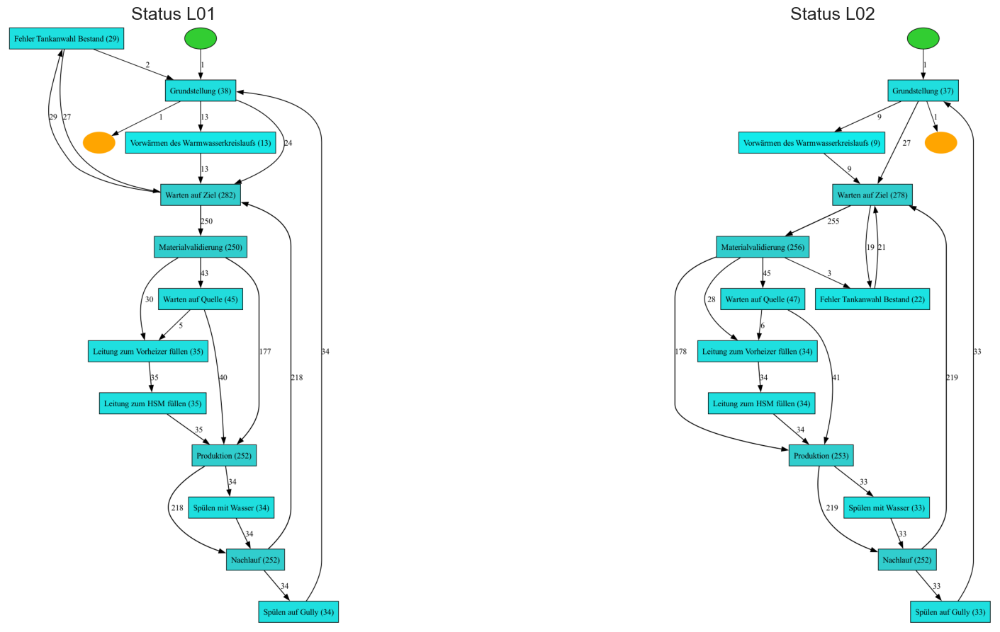

In [30]:
import pm4py
import matplotlib.pyplot as plt
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

# First visualization
df1 = df_combined_legend[['datetime', 'status_name_l01']].reset_index()
df1['index'] = 1
df1 = df1[['datetime', 'status_name_l01', 'index']]
df1.columns = ['timestamp', 'activity', 'case_id']
df1 = df1[df1['activity'] != df1['activity'].shift(-1)]
event_log1 = pm4py.format_dataframe(df1, case_id='case_id', activity_key='activity', timestamp_key='timestamp')
map1 = pm4py.discover_heuristics_net(event_log1)
gviz1 = hn_visualizer.apply(map1)
hn_visualizer.save(gviz1, "heuristics_net1.png")

# Second visualization
df2 = df_combined_legend[['datetime', 'status_name_l02']].reset_index()
df2['index'] = 1
df2 = df2[['datetime', 'status_name_l02', 'index']]
df2.columns = ['timestamp', 'activity', 'case_id']
df2 = df2[df2['activity'] != df2['activity'].shift(-1)]
event_log2 = pm4py.format_dataframe(df2, case_id='case_id', activity_key='activity', timestamp_key='timestamp')
map2 = pm4py.discover_heuristics_net(event_log2)
gviz2 = hn_visualizer.apply(map2)
hn_visualizer.save(gviz2, "heuristics_net2.png")

# Display both images side by side
fig, axs = plt.subplots(1, 2, figsize=(22, 11))  # Adjust the width and height as needed

# First image
img1 = plt.imread("heuristics_net1.png")
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Status L01')

# Second image
img2 = plt.imread("heuristics_net2.png")
axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Status L02')

plt.show()

Nur Hauptstati, die länger als 5 Stunden aktiviert sind.

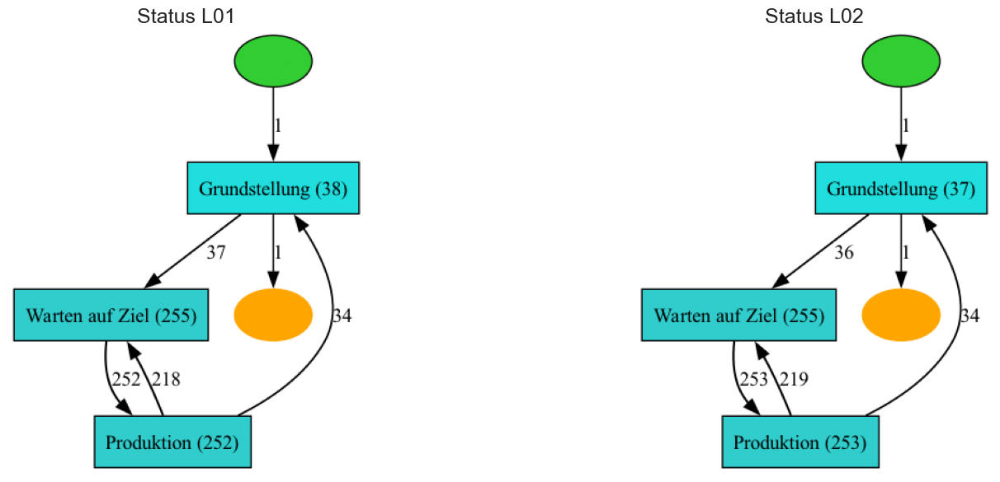

In [31]:
import pm4py
import matplotlib.pyplot as plt
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

df = df_combined_legend.copy()

df = df[df['status_name_l01'].isin(['Grundstellung', 'Produktion', 'Warten auf Ziel'])]
df = df[df['status_name_l02'].isin(['Grundstellung', 'Produktion', 'Warten auf Ziel'])]

# First visualization
df1 = df[['datetime', 'status_name_l01']].reset_index()
df1['index'] = 1
df1 = df1[['datetime', 'status_name_l01', 'index']]
df1.columns = ['timestamp', 'activity', 'case_id']
df1 = df1[df1['activity'] != df1['activity'].shift(-1)]
event_log1 = pm4py.format_dataframe(df1, case_id='case_id', activity_key='activity', timestamp_key='timestamp')
map1 = pm4py.discover_heuristics_net(event_log1)
gviz1 = hn_visualizer.apply(map1)
hn_visualizer.save(gviz1, "heuristics_net1.png")

# Second visualization
df2 = df[['datetime', 'status_name_l02']].reset_index()
df2['index'] = 1
df2 = df2[['datetime', 'status_name_l02', 'index']]
df2.columns = ['timestamp', 'activity', 'case_id']
df2 = df2[df2['activity'] != df2['activity'].shift(-1)]
event_log2 = pm4py.format_dataframe(df2, case_id='case_id', activity_key='activity', timestamp_key='timestamp')
map2 = pm4py.discover_heuristics_net(event_log2)
gviz2 = hn_visualizer.apply(map2)
hn_visualizer.save(gviz2, "heuristics_net2.png")

# Display both images side by side
fig, axs = plt.subplots(1, 2, figsize=(18, 7))  # Adjust the width and height as needed

# First image
img1 = plt.imread("heuristics_net1.png")
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Status L01')

# Second image
img2 = plt.imread("heuristics_net2.png")
axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Status L02')

plt.show()

Fragen:

- Was ist Grundstellung und Warten auf Ziel? -> Grundstellung ist die Reinigung

# Thermal Power and Energy

Den Mittelwert der Leistung für die verschiedenen Status nehmen und darstellen

In [32]:
# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

#display(df)

df_l01 = df[['datetime', 'status_name_l01', 'pro_power_kW_l01']]#.reset_index()
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['datetime', 'state', 'power', 'line']

df_l02 = df[['datetime', 'status_name_l02', 'pro_power_kW_l02']]#.reset_index()
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['datetime', 'state', 'power', 'line']

df = pd.concat([df_l01, df_l02])


df_status_power_calculated = df.copy()
df_status_power_calculated['type'] = 'calculated'

#display(df_status_power_calculated)

df_status = df.drop(columns='power').copy()

#display(df_status)


# Assuming df_status_energy is already defined
# Calculate the median power for each state
median_power = df_status_power_calculated.groupby('state')['power'].median().sort_values(ascending=False)

# Sort the DataFrame by the median power values
df_status_energy_sorted = df_status_power_calculated.set_index('state').loc[median_power.index].reset_index()

# # Create a boxplot to visualize the distribution of power for each state
# plt.figure(figsize=(15, 6))
# sns.boxplot(data=df_status_energy_sorted, y='state', x='power')
# plt.title('Distribution of Power for Each state')
# plt.ylabel('state')
# plt.xlabel('Power (kW)')
# plt.tight_layout()
# plt.show()

In [33]:
import pm4py

df = df_combined_legend[['datetime','status_name_l01', 'pro_power_kW_l01', 'status_name_l02', 'pro_power_kW_l02']].reset_index()

# Calculate mean power per activity and reset index
df = (df.groupby('status_name_l01')['pro_power_kW_l01']
      .mean()
      .reset_index())

df = df.sort_values(by = 'pro_power_kW_l01', ascending=False)

#df

In [34]:
import pm4py

df = df_combined_legend[['datetime','status_name_l01', 'pro_power_kW_l01', 'status_name_l02', 'pro_power_kW_l02']].reset_index()

# Calculate mean power per activity and reset index
df = (df.groupby('status_name_l02')['pro_power_kW_l02']
      .mean()
      .reset_index())

df = df.sort_values(by = 'pro_power_kW_l02', ascending=False)

#df

In [35]:
# # Create DataFrame with required columns
# df = df_combined_legend[['status_name_l01', 'pro_power_kW_l01', 'status_name_l02', 'pro_power_kW_l02']].reset_index()

# # Add column name prefix to values
# df['status_name_l01'] = 'l01_' + df['status_name_l01'].astype(str)
# df['status_name_l02'] = 'l02_' + df['status_name_l02'].astype(str)

# df = (df[['status_name_l01', 'pro_power_kW_l01', 'status_name_l02', 'pro_power_kW_l02']]
#       .groupby(['status_name_l01', 'status_name_l02'])
#       .agg({
#           'pro_power_kW_l01': 'median',
#       })
#       .reset_index())

# # Add total power column
# df['total_power'] = df['pro_power_kW_l01'] + df['pro_power_kW_l02']

# # Sort by total power if needed
# df = df.sort_values('total_power', ascending=False)

# df

In [36]:
pd.set_option('display.max_rows', 25)

df = df_combined_legend.copy()

df_l01 = df[['status_name_l01', 'pro_power_kW_l01']]#.reset_index()
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['state', 'power', 'line']


df_l02 = df[['status_name_l02', 'pro_power_kW_l02']]#.reset_index()
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['state', 'power', 'line']

df = pd.concat([df_l01, df_l02])

df = df.groupby('state').agg({'line': 'first', 'power': 'median'}).reset_index().sort_values(by='power', ascending=False)

df_status_power = df

display(df_status_power)

df = df[df['power'] > 1]

# Create a bar chart
fig = px.bar(df, x='state', y='power', color='line', title='Power demand by state')

fig.show()

,state,line,power
14,l02_Leitung zum HSM füllen,l02,1249.018416
2,l01_Leitung zum HSM füllen,l01,1239.125208
6,l01_Produktion,l01,1235.510225
20,l02_Spülen mit Wasser,l02,697.368180
8,l01_Spülen mit Wasser,l01,685.662060
18,l02_Produktion,l02,661.294609
19,l02_Spülen auf Gully,l02,472.550050
7,l01_Spülen auf Gully,l01,440.120761
5,l01_Nachlauf,l01,436.077713
17,l02_Nachlauf,l02,290.571790


Energie aus der Berechnung von Leistungsdaten des Produktes, die alle 5 Sekunden gemessen werden, berechnen.

In [37]:
import pandas as pd

pd.set_option('display.max_rows', 25)

# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

# Process line 01
df_l01 = df[['status_name_l01', 'pro_power_kW_l01']]
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['state', 'power', 'line']

# Process line 02
df_l02 = df[['status_name_l02', 'pro_power_kW_l02']]
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['state', 'power', 'line']

# Concatenate both lines
df = pd.concat([df_l01, df_l02])

# Calculate energy in kWh (power in kW * time in hours)
# 5 seconds = 5 / 3600 hours
df['energy_kWh'] = df['power'] * (5 / 3600)

# Calculate the total hours each state was activated
df['hours_activated'] = 5 / 3600  # Each row represents 5 seconds

df_energy_no_grouping = df.copy()

# Aggregate energy and hours by state
df = df.groupby('state').agg({'line': 'first', 'energy_kWh': 'sum', 'hours_activated': 'sum'}).reset_index().sort_values(by='energy_kWh', ascending=False)

# Filter states with energy greater than 1 kWh
#df_status_energy = df[df['energy_kWh'] > 1]

df = df[df['energy_kWh'] > 1]

df_status_energy = df.copy()

display(df_status_energy)

# Create a bar chart
fig = px.bar(df_status_energy, x='state', y='energy_kWh', color='line', hover_data=['hours_activated'], title='Energy Consumption by state')

fig.show()

,state,line,energy_kWh,hours_activated
6,l01_Produktion,l01,27050.255887,27.487500
18,l02_Produktion,l02,15630.512859,23.504167
1,l01_Grundstellung,l01,13531.708225,208.962500
13,l02_Grundstellung,l02,13198.091469,207.241667
20,l02_Spülen mit Wasser,l02,951.125731,1.333333
8,l01_Spülen mit Wasser,l01,946.458689,1.358333
3,l01_Leitung zum Vorheizer füllen,l01,752.154812,1.900000
15,l02_Leitung zum Vorheizer füllen,l02,724.657557,2.270833
5,l01_Nachlauf,l01,442.256200,1.048611
17,l02_Nachlauf,l02,364.016799,1.058333


Frage:

Sollten wir bei Grundstellung eine Leistung haben? oder nur bei Produktion?

In [38]:
# per hour does not work
# #df = df_combined_legend.copy()
# df = df_resampled_1H_weather.copy()

# df_l01 = df[['status_name_l01', 'pro_power_kW_l01']]#.reset_index()
# df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
# df_l01['line'] = 'l01'
# df_l01.columns = ['state', 'energy', 'line']


# df_l02 = df[['status_name_l02', 'pro_power_kW_l02']]#.reset_index()
# df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
# df_l02['line'] = 'l02'
# df_l02.columns = ['state', 'energy', 'line']

# df = pd.concat([df_l01, df_l02])


# df_status_energy = df.groupby('state').agg({'line': 'first', 'energy': 'sum'}).reset_index().sort_values(by='energy', ascending=False)

# df_status_energy

In [39]:
import pandas as pd
import plotly.graph_objects as go

df = df_status_energy.copy()
variable = 'energy_kWh'

# Calculate total power
total_power = df[variable].sum()

# Create nodes
nodes = ['Total ' + variable] + df['line'].unique().tolist() + df['state'].tolist()

# Create links
links = []

# From Total Power to Lines
for line in df['line'].unique():
    line_power = df[df['line'] == line][variable].sum()
    links.append({
        'source': nodes.index('Total ' + variable),
        'target': nodes.index(line),
        'value': line_power
    })

# From Lines to states
for _, row in df.iterrows():
    links.append({
        'source': nodes.index(row['line']),
        'target': nodes.index(row['state']),
        'value': row[variable]
    })

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=nodes
    ),
    link=dict(
        source=[link['source'] for link in links],
        target=[link['target'] for link in links],
        value=[link['value'] for link in links],
        color='rgba(255, 0, 0, 0.2)'  # Set the color of the links to a very transparent red
    )
)])

fig.update_layout(title_text="Sankey Diagram of Energy Distribution", font_size=10)
fig.show()

In [40]:
import pandas as pd
import plotly.express as px

pd.set_option('display.max_rows', 25)

# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

# Process line 01
df_l01 = df[['datetime', 'status_name_l01', 'pro_power_kW_l01']]
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['datetime', 'state', 'power', 'line']

# Process line 02
df_l02 = df[['datetime', 'status_name_l02', 'pro_power_kW_l02']]
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['datetime', 'state', 'power', 'line']

# Concatenate both lines
df = pd.concat([df_l01, df_l02])

# Calculate energy in kWh (power in kW * time in hours)
# 5 seconds = 5 / 3600 hours
df['energy_kWh'] = df['power'] * (5 / 3600)

# Extract hour, day of the week, and date from datetime
df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.dayofweek
df['date'] = df['datetime'].dt.date

# Group by hour, day of the week, and date, then calculate the total energy
df_grouped = df.groupby(['hour', 'day_of_week', 'date']).agg({'energy_kWh': 'sum'}).reset_index()

# Convert hour to a categorical type with a specified order
df_grouped['hour'] = df_grouped['hour'].astype(str)
df_grouped['hour'] = pd.Categorical(df_grouped['hour'], categories=[str(i) for i in range(24)], ordered=True)

# Create a heatmap using Plotly
fig = px.density_heatmap(df_grouped, x='hour', y='day_of_week', z='energy_kWh', 
                         labels={'hour': 'Hour of Day', 'day_of_week': 'Day of Week', 'energy_kWh': 'Total Energy (kWh)'},
                         title='Total Energy Consumption Heatmap per day of the week and hour of the day')

fig.update_layout(yaxis=dict(tickmode='array', tickvals=[0, 1, 2, 3, 4, 5, 6], 
                             ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']))

fig.show()

In [41]:
# import pandas as pd
# import numpy as np
# import plotly.graph_objects as go

# pd.set_option('display.max_rows', 25)

# # Assuming df_combined_legend is already defined
# df = df_combined_legend.copy()

# # Process line 01
# df_l01 = df[['datetime', 'status_name_l01', 'pro_power_kW_l01']]
# df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
# df_l01['line'] = 'l01'
# df_l01.columns = ['datetime', 'state', 'power', 'line']

# # Process line 02
# df_l02 = df[['datetime', 'status_name_l02', 'pro_power_kW_l02']]
# df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
# df_l02['line'] = 'l02'
# df_l02.columns = ['datetime', 'state', 'power', 'line']

# # Concatenate both lines
# df = pd.concat([df_l01, df_l02])

# # Calculate energy in kWh (power in kW * time in hours)
# # 5 seconds = 5 / 3600 hours
# df['energy_kWh'] = df['power'] * (5 / 3600)
# # 
# # Extract hour, minute, and day of the week from datetime
# df['hour'] = df['datetime'].dt.hour
# df['minute'] = df['datetime'].dt.minute
# df['day_of_week'] = df['datetime'].dt.dayofweek

# # Group by hour, minute, and day of the week and sum the energy_kWh
# df_grouped = df.groupby(['hour', 'minute', 'day_of_week']).agg({'energy_kWh': 'sum'}).reset_index()

# # Create a finer grid for hours and minutes
# hours = np.linspace(0, 24, 24 * 60 + 1)  # 24 hours * 60 minutes + 1 to include 24:00
# days = df_grouped['day_of_week'].unique()

# # Create an empty array for the interpolated values
# interpolated_values = np.zeros((len(days), len(hours)))

# # Interpolate for each day
# for i, day in enumerate(days):
#     day_data = df_grouped[df_grouped['day_of_week'] == day]
#     time_in_minutes = day_data['hour'] * 60 + day_data['minute']
#     energy_values = day_data['energy_kWh']
#     if len(time_in_minutes) > 1:  # Ensure there are enough points to interpolate
#         interpolated_values[i, :] = np.interp(hours, time_in_minutes, energy_values)
#     else:
#         interpolated_values[i, :] = np.zeros(len(hours))  # Handle cases with insufficient data

# # Create a 3D surface plot using Plotly
# fig = go.Figure(data=[go.Surface(z=interpolated_values, x=hours, y=days)])

# fig.update_layout(title='Total Energy Consumption 3D Surface Plot',
#                   scene=dict(
#                       xaxis_title='Time of Day (Hour and Minute)',
#                       yaxis_title='Day of Week',
#                       zaxis_title='Total Energy (kWh)',
#                       yaxis=dict(tickmode='array', tickvals=[0, 1, 2, 3, 4, 5, 6], 
#                                  ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
#                   ))

# fig.show()

In [42]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

pd.set_option('display.max_rows', 25)

# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

# Process line 01
df_l01 = df[['datetime', 'status_name_l01', 'pro_power_kW_l01']]
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['datetime', 'state', 'power', 'line']

# Process line 02
df_l02 = df[['datetime', 'status_name_l02', 'pro_power_kW_l02']]
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['datetime', 'state', 'power', 'line']

# Concatenate both lines
df = pd.concat([df_l01, df_l02])

# Calculate energy in kWh (power in kW * time in hours)
# 5 seconds = 5 / 3600 hours
df['energy_kWh'] = df['power'] * (5 / 3600)

# Extract hour and day of the week from datetime
df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.dayofweek

# Group by hour and day of the week and sum the energy_kWh
df_grouped = df.groupby(['hour', 'day_of_week']).agg({'energy_kWh': 'sum'}).reset_index()

# Pivot the data to create a matrix for the surface plot
df_pivot = df_grouped.pivot(index='day_of_week', columns='hour', values='energy_kWh')

# Interpolate to make the hour a continuous variable
hours = np.linspace(0, 23, 100)  # 100 points between 0 and 23 hours
days = df_pivot.index

# Create an empty array for the interpolated values
interpolated_values = np.zeros((len(days), len(hours)))

# Interpolate for each day
for i, day in enumerate(days):
    interpolated_values[i, :] = np.interp(hours, df_pivot.columns, df_pivot.loc[day].values)

# Create a 3D surface plot using Plotly
fig = go.Figure(data=[go.Surface(z=interpolated_values, x=hours, y=days)])

fig.update_layout(
    title='Total Energy Consumption 3D Surface Plot per day of the week and hour of the day',
    scene=dict(
        xaxis_title='Hour of Day',
        yaxis_title='Day of Week',
        zaxis_title='Total Energy (kWh)',
        yaxis=dict(tickmode='array', tickvals=[0, 1, 2, 3, 4, 5, 6], 
                   ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    ),
    width=1200,  # Adjust the width as needed
    height=800   # Adjust the height as needed
)

fig.show()

In [63]:
df_combined_legend.columns

Index(['datetime', 'schritt_l01_', 'pro_menge_l01_kg', 'pro_menge_l02_kg',
       'schritt_l02_', 'pro_temp_out_l01_', 'pro_temp_out_l02_', 'mat_id_m01_',
       'mat_id_m02_', 'mat_id_m03_', 'pro_volstrom_l01_l/h',
       'pro_volstrom_l02_l/h', 'medium_temp_ein_l01', 'medium_temp_ein_l02_',
       'dampfmenge_kg/h_nmb+cip_', 'cip_turm_f_', 'cip_turm_g_',
       'status_name_l01', 'status_name_l02', 'pro_power_kW_l01',
       'pro_power_kW_l02', 'medium_power_kW'],
      dtype='object')

In [64]:
import pandas as pd
from pathlib import Path

# Define the path to the current file's location
current_path = Path(__file__).resolve().parent if '__file__' in globals() else Path().resolve()

# Define the folder path
files_folder = current_path.parent.parent.parent / 'data' / 'silver' / 'company_2'

# Ensure the folder exists
files_folder.mkdir(parents=True, exist_ok=True)

# Save the DataFrame to Parquet
df_combined_legend.to_parquet(files_folder / 'df_combined_legend.parquet')

# Modelling of Process and Energy with Process Mining

Ein Energiebedarfsmodell aus den Prozess- und Energiedaten erstellen.

In [43]:
df = df_status_power.copy()

df['power'][df['state'].isin(['l02_Produktion'])] = 1100

df_fixed_power = df.copy()

/var/folders/j7/bzg541gd7dg10j_2qvx3s4j00000gn/T/ipykernel_56299/2461426227.py:3: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




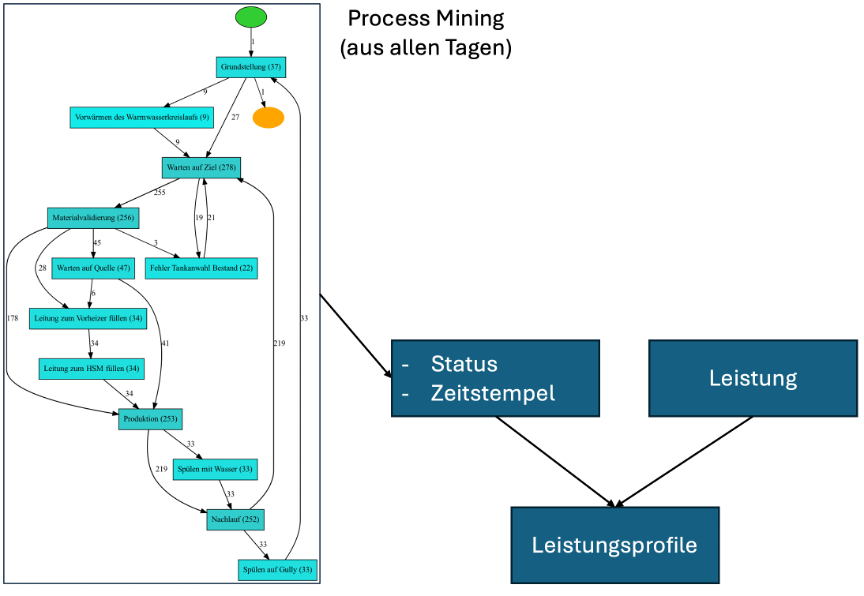

In [44]:
pd.set_option('display.max_rows', None)
df_fixed_power
pd.set_option('display.max_rows', 10)

In [45]:
#df = df_status.merge(df_status_power.drop(columns='line'), on='state', how='left')
df = df_status.merge(df_fixed_power.drop(columns='line'), on='state', how='left')

df['type'] = 'process_mining'
#display(df)

df_status_power_pm = df.copy()

#display(df_status_power_pm)

df_pm_and_calculated = pd.concat([df_status_power_pm, df_status_power_calculated])#[df_pm_and_calculated['power']> 1]

#df_pm_and_calculated

In [46]:
import pandas as pd
from sklearn.metrics import r2_score, mean_absolute_error

# Assuming df_status_power_pm and df_status_power_calculated are already defined
df_1 = df_status_power_calculated.copy().reset_index(drop=True).reset_index(drop=True) 
df_1['unique_id'] = df_1['datetime'].astype(str) + '_' + df_1['state']

#df_1 = df_1[df_1['state'].isin(['l01_Produktion ', 'l02_Produktion'])]
unique_id_list = df_1['unique_id'].tolist()

df_2 = df_status_power_pm.copy().reset_index(drop=True).reset_index(drop=True) 
df_2 = df_2.loc[df_1.index, ['datetime', 'state', 'power']]  # Keep only 'datetime', 'state', and 'power' columns
df_2['unique_id'] = df_2['datetime'].astype(str) + '_' + df_1['state']
df_2 = df_2[df_2['unique_id'].isin(unique_id_list)]

# # Merge the two DataFrames on the 'datetime' and 'state' columns to align them
df_joined = df_1.merge(df_2, on=['datetime', 'state'], suffixes=('_calculated', '_pm'))

df_joined['residual'] = abs(df_joined['power_pm'] - df_joined['power_calculated'])

# # Calculate the R² score
r2 = r2_score(df_joined['power_pm'], df_joined['power_calculated'])

# # Calculate the Mean Absolute Error (MAE)
mae = mean_absolute_error(df_joined['power_pm'], df_joined['power_calculated'])

# # # Calculate the Mean Absolute Percentage Error (MAPE)
# # def mean_absolute_percentage_error(y_true, y_pred):
# #     mask = y_true != 0
# #     return (abs((y_true[mask] - y_pred[mask]) / y_true[mask])).mean() * 100

print(f'R² score between power of process mining and calculated data: {r2:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')

#df_joined

R² score between power of process mining and calculated data: 0.2495
Mean Absolute Error (MAE): 48.6656


Visualisierung echten daten (power_calculated) vs modellierte Daten mit Leistung pro Maschinstatus und Process Mining (power_pm)

In [47]:
import pandas as pd
import plotly.express as px

# Assuming df_joined is already defined
# Filter the DataFrame for one specific day (e.g., '2023-01-01')
one_day_df = df_joined[df_joined['datetime'].dt.date == pd.to_datetime('2024-11-06').date()]

one_day_df

# Create a Plotly line chart
fig = px.line(one_day_df, x='datetime', y=['power_pm', 'power_calculated'], 
              hover_data=['state'],
              labels={'value': 'Power (kW)', 'variable': 'Type'},
              title='Power Consumption for One Day for both Lines')

fig.show()

# Process and energy model

- Wir können eine Simulation durchführen und sie mit Process Mining kombinieren, um ein besseres Profil zu erhalten.
- Was wäre, wenn wir die Daten für einen ganzen Tag erfassen und nicht nur den durchschnittlichen Energiebedarf? Können wir diese Daten zusammen mit den Prozessinformationen nutzen, um Profile für die gesamte Zeit zu erstellen?
- Wir kennen den Volumenstrom, den Status und die resultierende Leistung. Wir möchten diese Informationen nutzen, um ein ML-Modell zu trainieren und daraus den Energieverbrauch basierend auf dem Volumenstrom und dem Status zu generalisieren.

In [48]:
#df_combined_legend.columns

In [49]:
# Assuming df_combined_legend is already defined
df = df_combined_legend.copy()

df_l01 = df[['datetime', 'status_name_l01', 'pro_power_kW_l01', 'pro_volstrom_l01_l/h']]#.reset_index()
df_l01['status_name_l01'] = 'l01_' + df_l01['status_name_l01'].astype(str)
df_l01['line'] = 'l01'
df_l01.columns = ['datetime', 'state', 'power', 'vol', 'line']

df_l02 = df[['datetime', 'status_name_l02', 'pro_power_kW_l02', 'pro_volstrom_l02_l/h']]#.reset_index()
df_l02['status_name_l02'] = 'l02_' + df_l02['status_name_l02'].astype(str)
df_l02['line'] = 'l02'
df_l02.columns = ['datetime', 'state', 'power', 'vol', 'line']

df = pd.concat([df_l01, df_l02])

df_status_power_calculated = df.copy()
df_status_power_calculated['type'] = 'calculated'

#display(df_status_power_calculated)

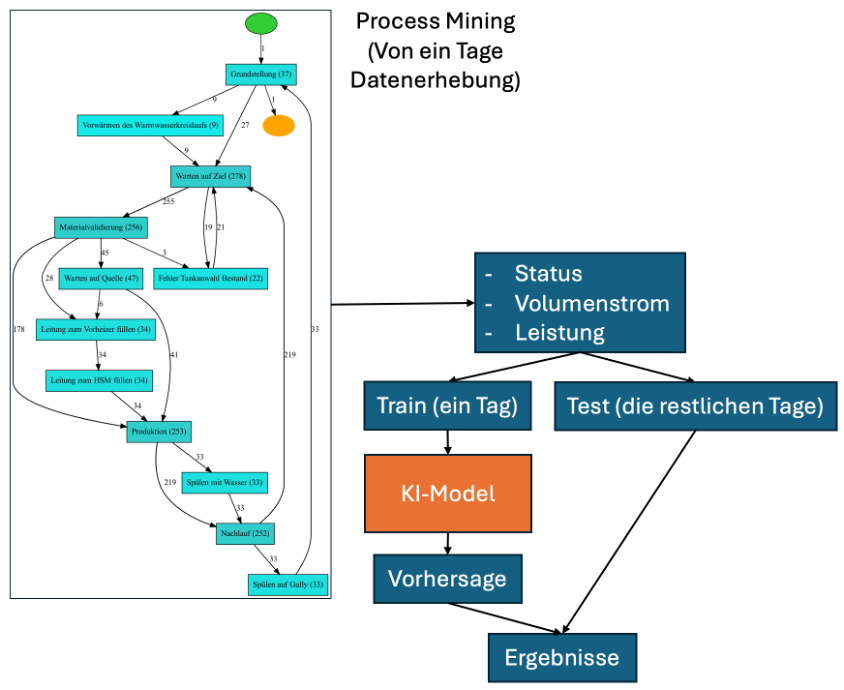

In [50]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from xgboost import XGBRegressor

# Assuming df_status_power_calculated is already defined
df = df_status_power_calculated.copy()

# One-hot encode the 'state' column
df = pd.get_dummies(df, columns=['state'])
df_original = df.copy()
#print(df.columns)
#display(df)

# Filter the DataFrame for the specific day
df = df[df['datetime'].dt.date == pd.to_datetime('2024-11-08').date()]

df = df.drop(columns=['datetime', 'line', 'type'])
#display(df)

# Define features and target
X = df.drop(columns=['power'])
y = df['power']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the XGBoost model
model = XGBRegressor()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate the R² score
r2 = r2_score(y_test, y_pred)

# Calculate the Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)

print(f'R² score: {r2:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')

R² score: 0.9459
Mean Absolute Error (MAE): 11.6900


Was lernt es? Im Wesentlichen Q basierend nur auf dem Volumen für jeden Status mit der entsprechenden Variabilität des realen Prozesses.

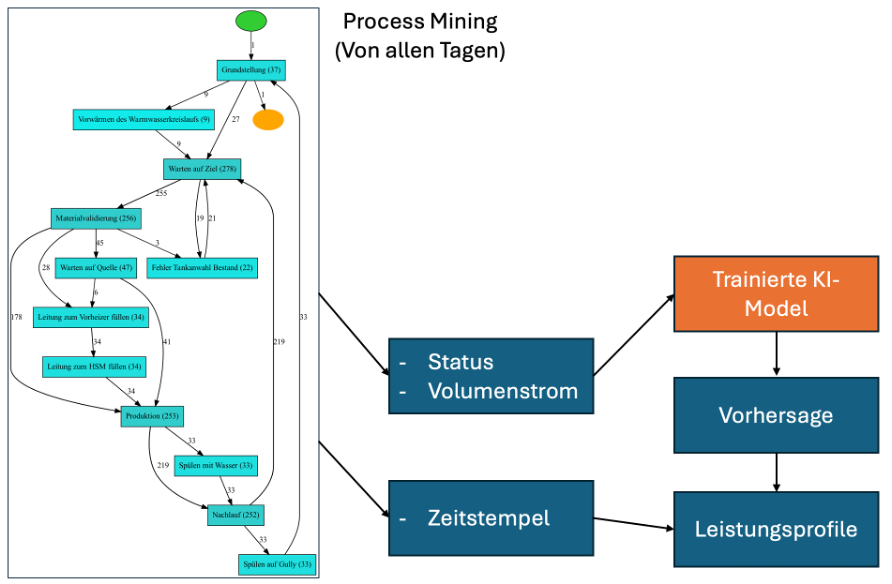

In [51]:
# Calculate r2 witht eh rest of the days

df = df_original.copy()

df = df[df['datetime'].dt.date != pd.to_datetime('2024-11-08').date()]

df_X = df.drop(columns=['datetime', 'line', 'type', 'power'])

df['pm_ml'] = model.predict(df_X)

# Calculate the R² score
r2 = r2_score(df['pm_ml'], df['power'])

# Calculate the Mean Absolute Error (MAE)
mae = mean_absolute_error(df['pm_ml'], df['power'])

df_predictions = df

print(f'R² score: {r2:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')

R² score: 0.9217
Mean Absolute Error (MAE): 11.2194


Visualisierung der echten Daten (power_calculated) vs. modellierte Daten mit Leistung pro Maschinenstatus und Process Mining (power_pm).

In [52]:
import pandas as pd
import plotly.express as px

df = df_predictions.copy()

# Assuming df_joined is already defined
# Filter the DataFrame for one specific day (e.g., '2023-01-01')
one_day_df = df[df['datetime'].dt.date == pd.to_datetime('2024-11-06').date()]

# Create a Plotly line chart
fig = px.line(one_day_df, x='datetime', y=['pm_ml', 'power'], 
              #hover_data=['state'],
              labels={'value': 'Power (kW)', 'variable': 'Type'},
              title='Power Consumption for One Day with Process Mining and ML Model')

fig.show()

Test von der Modellierung -> es funktioniert

Vorteile von Modellen für die Energiebedarfsanalyse:

- WMan könnte dieses Model von Prozess und Energie als Simulation nutzen, um Szenarien in der Zukunft und Vergangenheit zu evaluieren, den Einfluss des Produkts und des Prozesses auf den Energiebedarf zu verstehen und weitere Energieoptimierungsmaßnahmen abzuleiten.

Es ist möglich, die Dampfmenge von den ganzen Bereich von den Prozessinformationen zu trennen und zu analysieren, wie viel Leistung für die Linien notwendig ist. Wir benötigen die korrekte Berechnung der Dampfleistung.

# Ende der Exploration

- [Index](#Index)

 # Visualize all variables per hour

Visualisierung und beschreibene Statistiken von jeder Variable zum besseren Datenverständnis: nicht relevant für die Analyse.

In [53]:
#### The variables are resampled per hour
pd.set_option('display.max_rows', 10)

# Display the resampled DataFrame
display(df_resampled_1H)
visualize_data(df_resampled_1H, datetime_col="datetime", library="plotly")

,datetime,pro_temp_out_l01_,pro_temp_out_l02_,pro_volstrom_l01_l/h,pro_volstrom_l02_l/h,medium_temp_ein_l01,medium_temp_ein_l02_,dampfmenge_kg/h_nmb+cip_,cip_turm_f_,cip_turm_g_,...,medium_power_kW,schritt_l01_,schritt_l02_,mat_id_m01_,mat_id_m02_,mat_id_m03_,status_name_l01,status_name_l02,pro_menge_l01_kg,pro_menge_l02_kg
0,2024-11-03 14:00:00,31.265510,30.102778,0.000000,0.0,33.805155,30.976443,178.083831,0.000000,0.000000,...,103.882235,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
1,2024-11-03 15:00:00,31.401458,30.520577,0.000000,0.0,34.466892,31.528750,0.095948,0.000000,0.000000,...,0.055970,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
2,2024-11-03 16:00:00,31.587886,30.837756,0.000000,0.0,35.209901,32.005532,87.878568,0.000000,0.000000,...,51.262498,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
3,2024-11-03 17:00:00,31.830874,30.985454,0.000000,0.0,35.806259,32.213240,789.416152,24.458333,0.000000,...,460.492755,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
4,2024-11-03 18:00:00,32.250834,31.110531,0.000000,0.0,36.103116,32.370327,944.637849,30.000000,0.000000,...,551.038745,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508,2024-11-24 18:00:00,28.874097,26.958535,0.000000,0.0,30.798845,28.301286,1400.105293,30.000000,0.000000,...,816.728088,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
509,2024-11-24 19:00:00,28.820032,26.930602,0.000000,0.0,30.792101,28.253046,523.983050,26.875000,2.916667,...,305.656779,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
510,2024-11-24 20:00:00,28.795422,26.904666,0.000000,0.0,30.787429,28.188296,1131.047252,0.000000,30.000000,...,659.777564,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
511,2024-11-24 21:00:00,38.540029,26.870364,4155.010707,0.0,37.949338,28.111886,736.713860,0.000000,30.000000,...,429.749751,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0


Variable: pro_temp_out_l01_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l01_,513.0,45.034676,13.067516,20.908731,29.915018,48.326423,57.385284,67.489036,513


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_temp_out_l02_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l02_,513.0,51.001563,18.970338,21.494713,28.966464,54.884342,70.658773,82.572639,513


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_volstrom_l01_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l01_l/h,513.0,1374.742485,1956.045583,0.0,0.0,940.910896,2164.566899,15576.577255,285


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_volstrom_l02_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l02_l/h,513.0,981.832009,1729.342444,0.0,0.0,551.20376,1221.699848,10735.411569,276


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l01


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l01,513.0,46.735183,9.587385,30.787429,37.658161,49.461783,54.128395,71.410157,513


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l02_


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l02_,513.0,54.474622,16.651379,28.063795,35.192728,59.722418,69.286205,82.903729,513


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: dampfmenge_kg/h_nmb+cip_


,count,mean,std,min,25%,50%,75%,max,unique
dampfmenge_kg/h_nmb+cip_,513.0,212.848245,267.577715,0.0,74.564867,150.592569,223.241484,1526.393308,493


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: cip_turm_f_


,count,mean,std,min,25%,50%,75%,max,unique
cip_turm_f_,513.0,4.036468,10.103232,0.0,0.0,0.0,0.0,30.0,15


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: cip_turm_g_


,count,mean,std,min,25%,50%,75%,max,unique
cip_turm_g_,513.0,1.231188,5.79895,0.0,0.0,0.0,0.0,30.0,9


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_power_kW_l01


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l01,513.0,85.167112,116.930334,0.0,0.0,58.279304,137.093837,727.141247,285


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_power_kW_l02


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l02,513.0,61.5158,107.218676,0.0,0.0,35.127979,76.800471,592.855105,276


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_power_kW


,count,mean,std,min,25%,50%,75%,max,unique
medium_power_kW,513.0,124.161476,156.087001,0.0,43.496172,87.845665,130.224199,890.396097,493


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: schritt_l01_


,count,mean,std,min,25%,50%,75%,max,unique
schritt_l01_,513.0,5.306043,12.809828,0.0,0.0,4.0,4.0,105.0,6


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: schritt_l02_


,count,mean,std,min,25%,50%,75%,max,unique
schritt_l02_,513.0,4.247563,9.215896,0.0,0.0,4.0,4.0,105.0,6


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m01_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m01_,513.0,4.100113e+06,4.343148e+06,0.0,0.0,0.0,8681590.0,8842022.0,12


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m02_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m02_,513.0,3.621564e+06,4.284977e+06,0.0,0.0,0.0,8681590.0,8681697.0,6


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m03_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m03_,513.0,3.215407e+06,4.196470e+06,0.0,0.0,0.0,8681588.0,8681697.0,5


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l01


,count,unique,top,freq
status_name_l01,513,6,Warten auf Ziel,263


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l02


,count,unique,top,freq
status_name_l02,513,6,Warten auf Ziel,276


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_menge_l01_kg


,count,mean,std,min,25%,50%,75%,max,unique
pro_menge_l01_kg,513.0,39550.975709,47319.314961,0.0,0.0,12879.337791,80802.139517,229725.203244,268


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_menge_l02_kg


,count,mean,std,min,25%,50%,75%,max,unique
pro_menge_l02_kg,513.0,21644.421612,38516.170184,0.0,0.0,6202.239353,35917.649105,416797.637996,263


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


 # Visualize all variables per minute


,datetime,pro_temp_out_l01_,pro_temp_out_l02_,pro_volstrom_l01_l/h,pro_volstrom_l02_l/h,medium_temp_ein_l01,medium_temp_ein_l02_,dampfmenge_kg/h_nmb+cip_,cip_turm_f_,cip_turm_g_,...,medium_power_kW,schritt_l01_,schritt_l02_,mat_id_m01_,mat_id_m02_,mat_id_m03_,status_name_l01,status_name_l02,pro_menge_l01_kg,pro_menge_l02_kg
0,2024-11-03 14:04:08.500,31.194933,29.912381,0.000000,0.0,33.583172,30.779080,534.903069,0.0,0.0,...,312.026790,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
1,2024-11-03 14:07:28.500,31.218262,29.930917,0.000000,0.0,33.585251,30.790202,69.751881,0.0,0.0,...,40.688597,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
2,2024-11-03 14:12:28.500,31.239601,29.966092,0.000000,0.0,33.601436,30.824562,0.000000,0.0,0.0,...,0.000000,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
3,2024-11-03 14:17:28.500,31.260218,29.996835,0.000000,0.0,33.637243,30.852141,0.000000,0.0,0.0,...,0.000000,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
4,2024-11-03 14:22:28.500,31.259585,30.039424,0.000000,0.0,33.677662,30.885055,0.000000,0.0,0.0,...,0.000000,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6142,2024-11-24 21:52:28.500,77.384078,26.853751,12914.145435,0.0,72.732928,28.071108,590.808253,0.0,30.0,...,344.638148,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
6143,2024-11-24 21:57:28.500,78.219853,26.851310,16213.515535,0.0,74.471029,28.068576,378.056277,0.0,30.0,...,220.532828,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
6144,2024-11-24 22:02:28.500,52.311017,26.848778,16644.530941,0.0,72.373679,28.064507,225.338783,0.0,30.0,...,131.447623,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0
6145,2024-11-24 22:07:28.500,34.732892,26.845884,14537.906331,0.0,70.740469,28.063784,281.635803,0.0,30.0,...,164.287552,0,0,0,0,0,Grundstellung,Grundstellung,0.0,0.0


Variable: pro_temp_out_l01_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l01_,6147.0,45.037515,14.687741,14.743381,29.747631,46.73801,58.158185,78.824689,6142


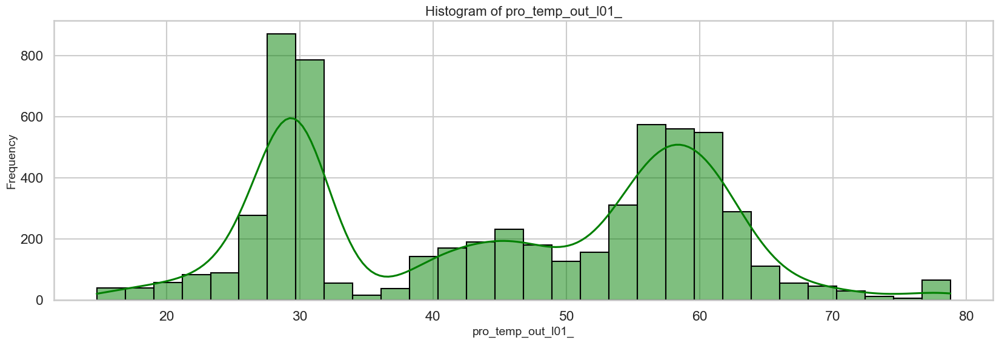

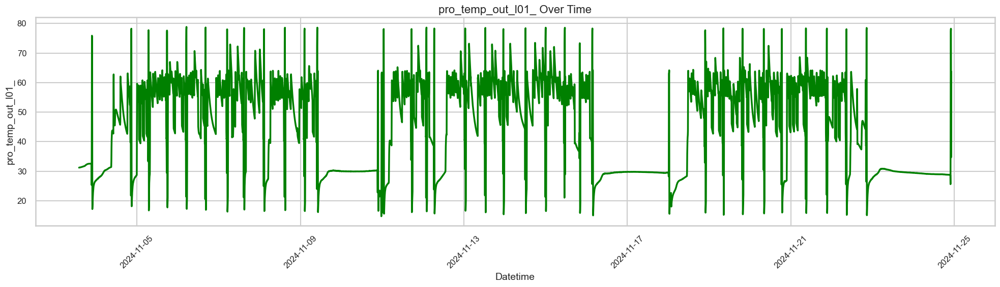

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_temp_out_l02_


,count,mean,std,min,25%,50%,75%,max,unique
pro_temp_out_l02_,6147.0,51.040444,20.606617,14.953794,28.788565,56.586553,69.896556,93.971264,6145


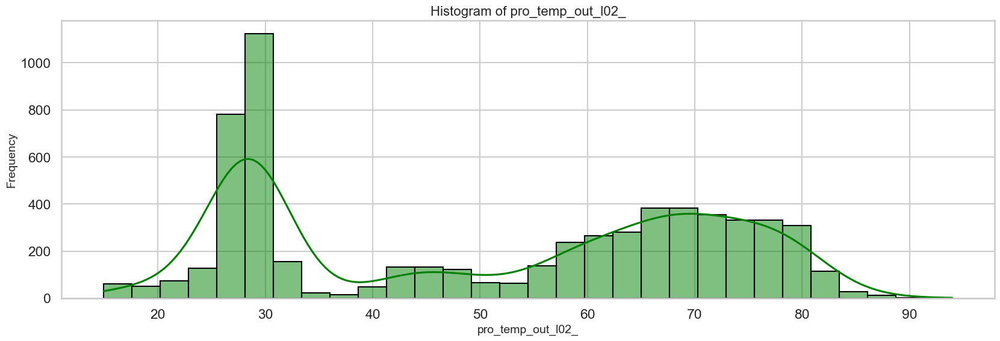

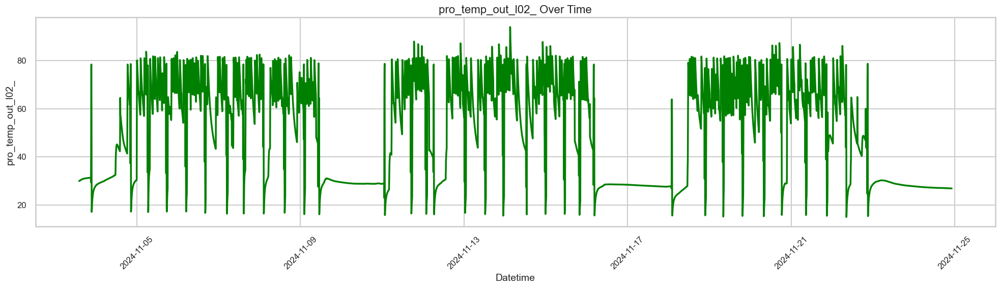

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_volstrom_l01_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l01_l/h,6147.0,1353.48506,4060.019276,0.0,0.0,0.0,0.0,20178.274642,829


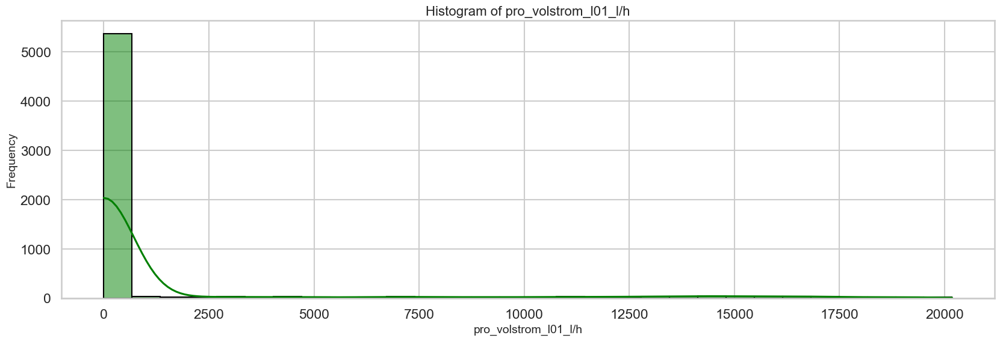

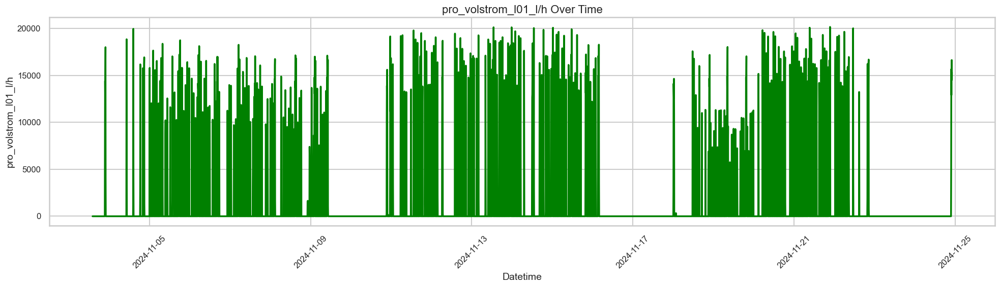

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_volstrom_l02_l/h


,count,mean,std,min,25%,50%,75%,max,unique
pro_volstrom_l02_l/h,6147.0,984.603004,3454.136297,0.0,0.0,0.0,0.0,20844.150561,733


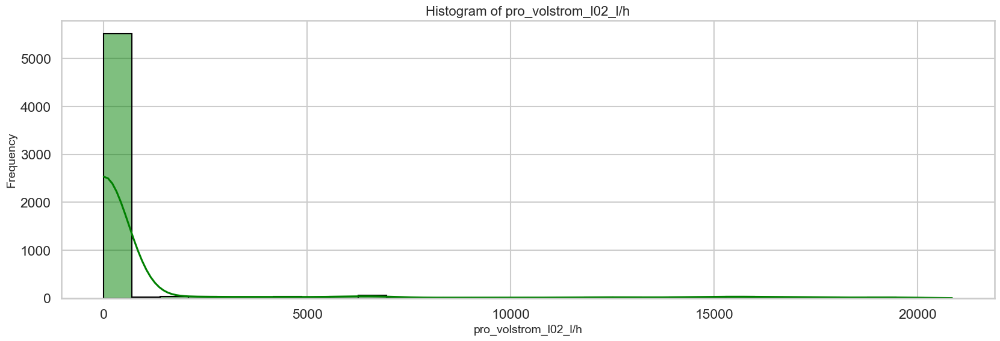

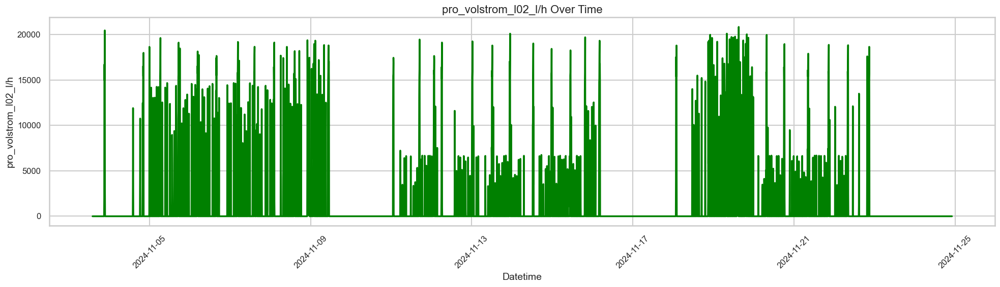

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l01


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l01,6147.0,46.698261,10.813546,30.770309,36.669786,48.486328,53.763654,77.81467,6143


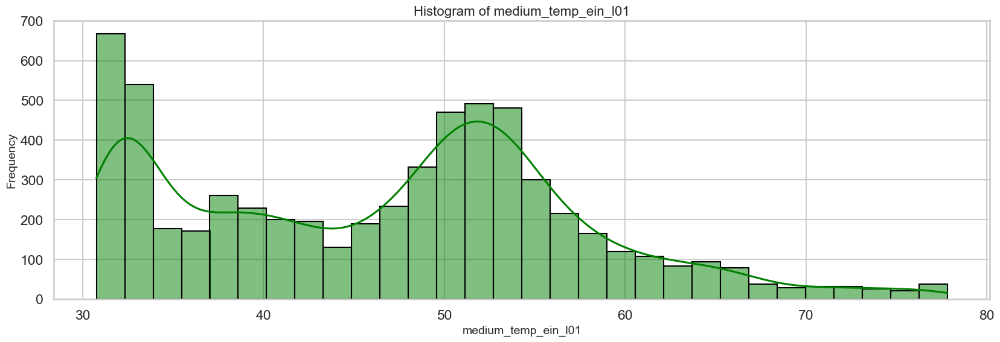

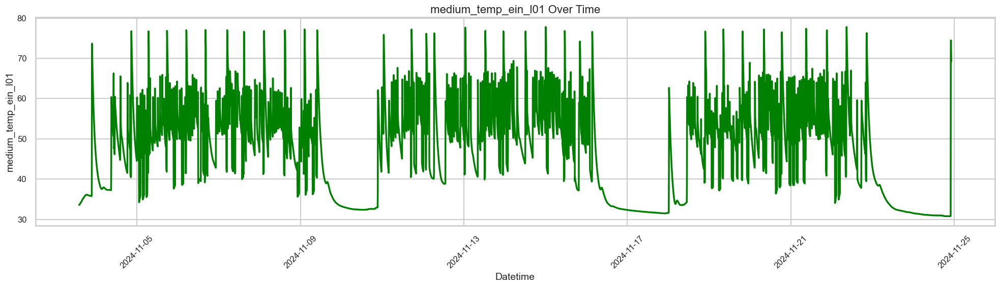

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_temp_ein_l02_


,count,mean,std,min,25%,50%,75%,max,unique
medium_temp_ein_l02_,6147.0,54.517485,17.31721,28.05854,35.174108,58.120208,69.6842,89.812011,6142


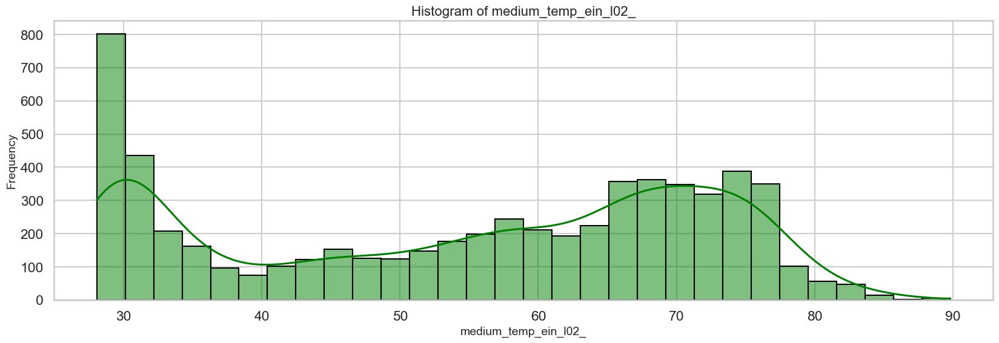

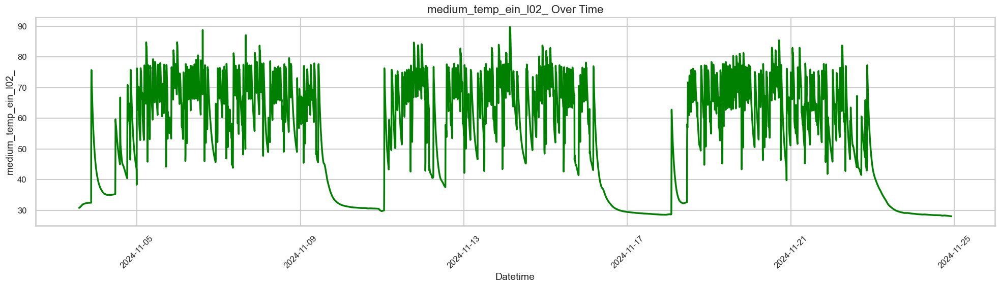

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: dampfmenge_kg/h_nmb+cip_


,count,mean,std,min,25%,50%,75%,max,unique
dampfmenge_kg/h_nmb+cip_,6147.0,212.775197,361.438447,0.0,0.0,16.481,307.376061,2765.793791,3189


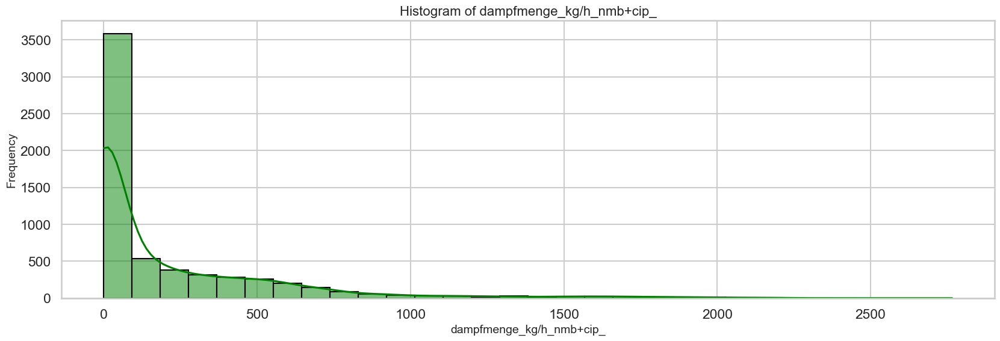

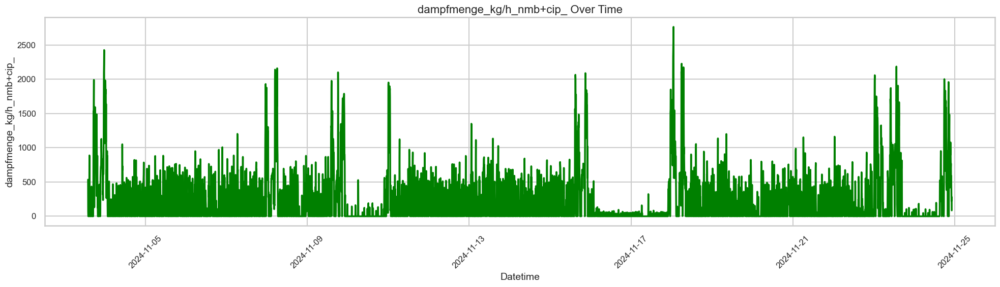

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: cip_turm_f_


,count,mean,std,min,25%,50%,75%,max,unique
cip_turm_f_,6147.0,4.042378,10.224539,0.0,0.0,0.0,0.0,30.0,15


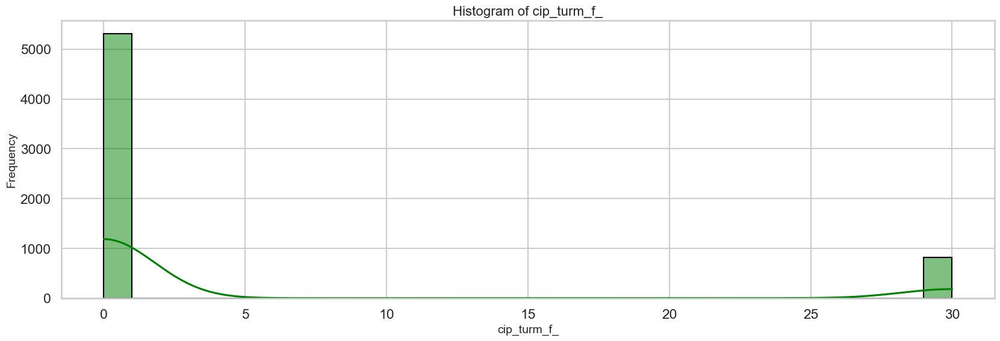

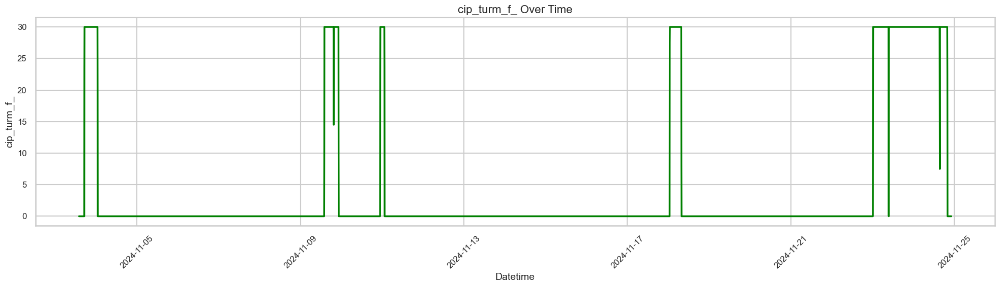

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: cip_turm_g_


,count,mean,std,min,25%,50%,75%,max,unique
cip_turm_g_,6147.0,1.189279,5.840697,0.0,0.0,0.0,0.0,30.0,9


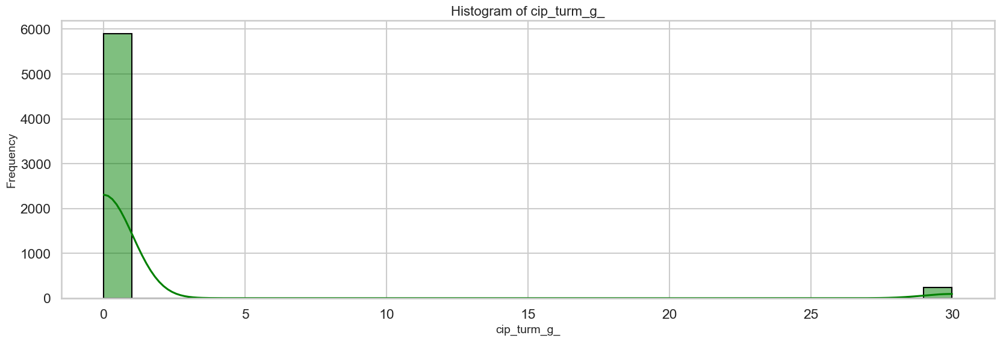

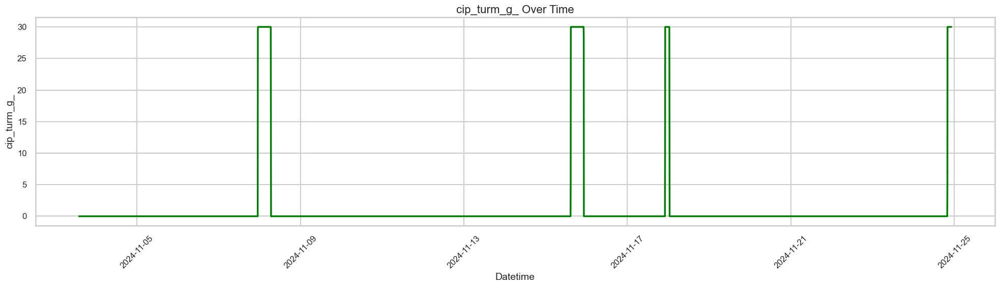

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_power_kW_l01


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l01,6147.0,84.237237,263.774799,0.0,0.0,0.0,0.0,1442.182347,829


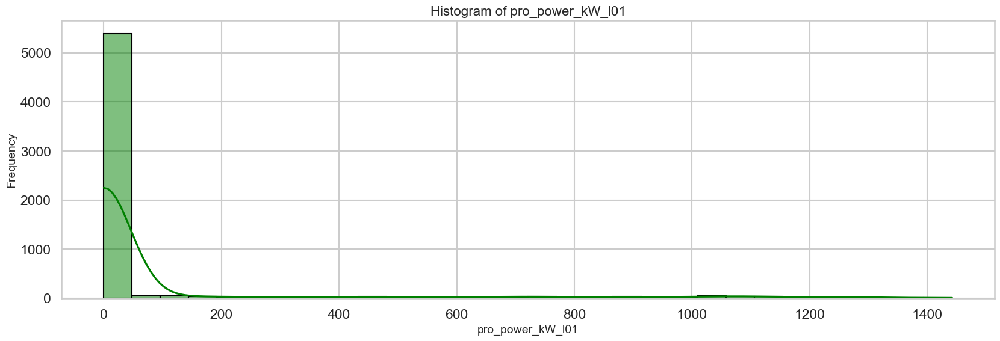

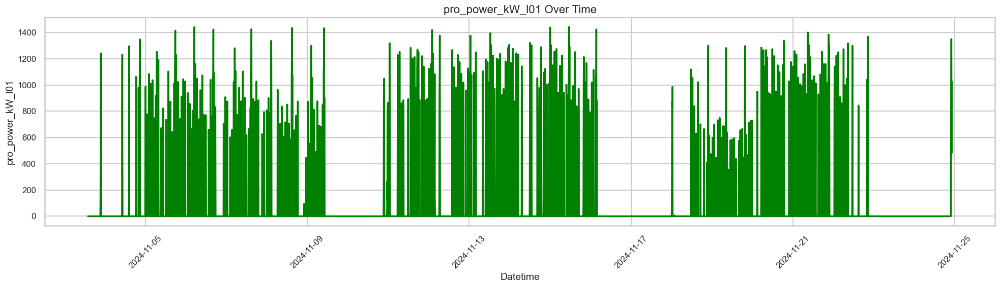

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_power_kW_l02


,count,mean,std,min,25%,50%,75%,max,unique
pro_power_kW_l02,6147.0,61.698178,224.161121,0.0,0.0,0.0,0.0,1562.425936,733


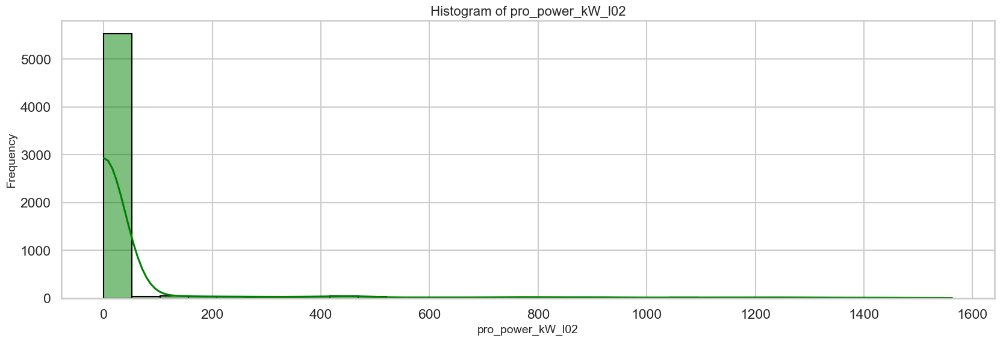

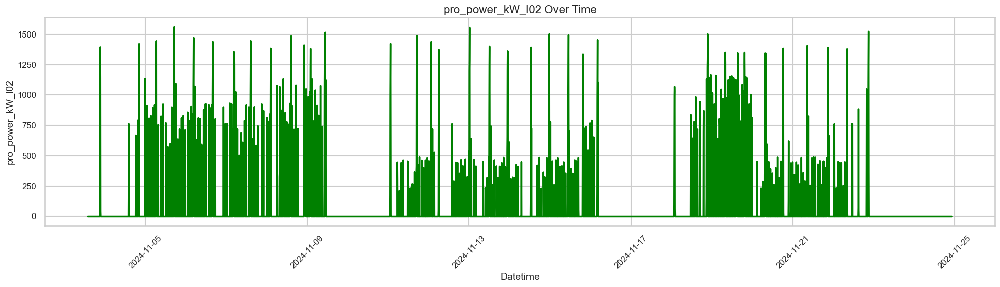

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: medium_power_kW


,count,mean,std,min,25%,50%,75%,max,unique
medium_power_kW,6147.0,124.118865,210.839094,0.0,0.0,9.613917,179.302702,1613.379711,3189


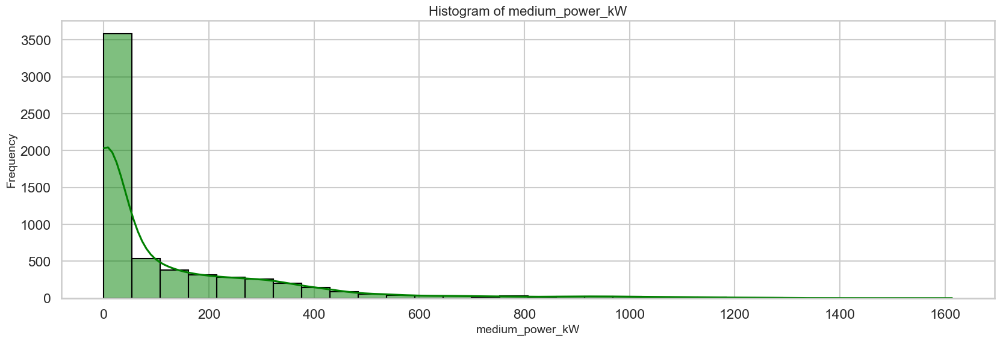

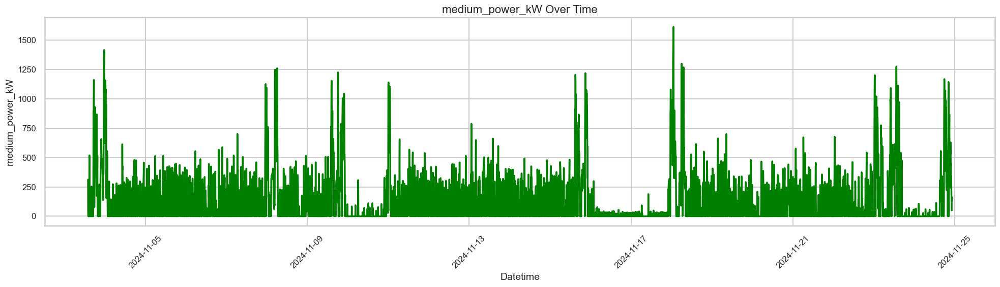

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: schritt_l01_


,count,mean,std,min,25%,50%,75%,max,unique
schritt_l01_,6147.0,4.650236,10.950901,0.0,0.0,4.0,4.0,105.0,12


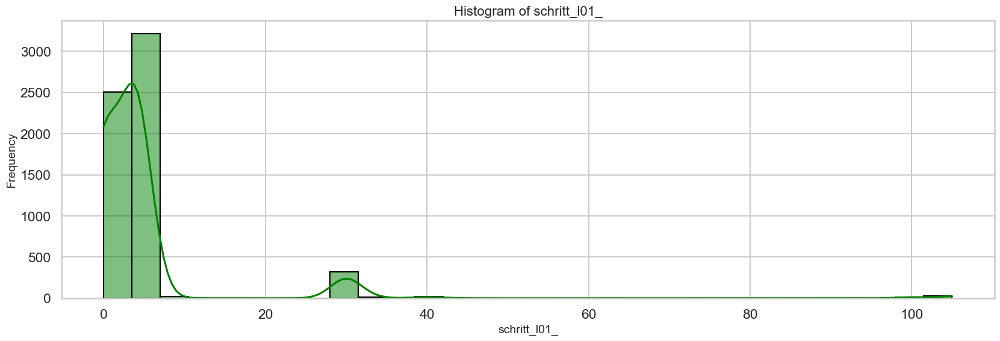

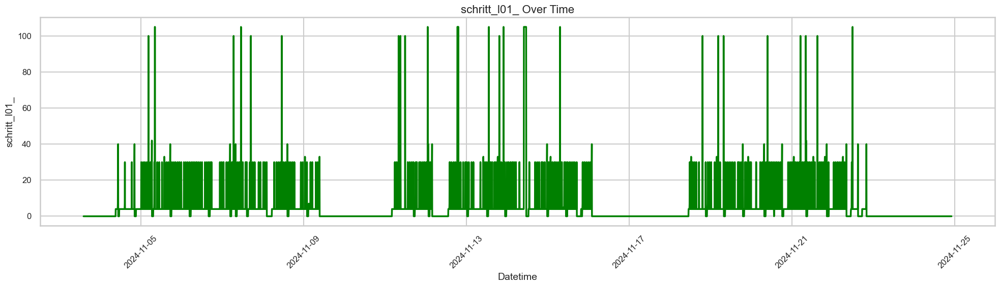

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: schritt_l02_


,count,mean,std,min,25%,50%,75%,max,unique
schritt_l02_,6147.0,4.076135,8.553923,0.0,0.0,4.0,4.0,105.0,11


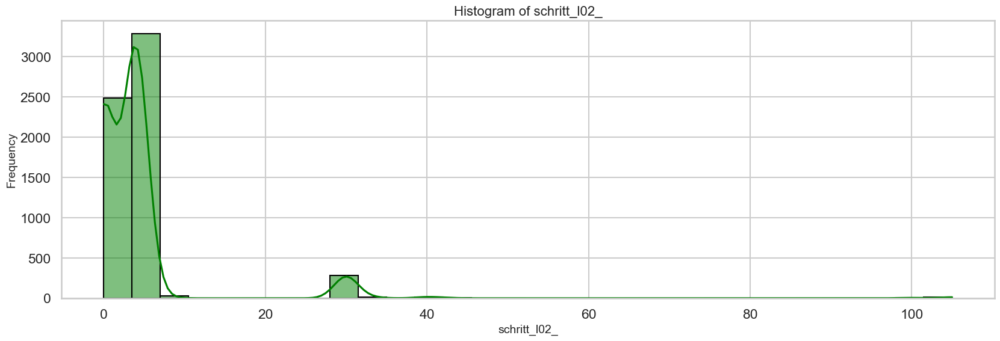

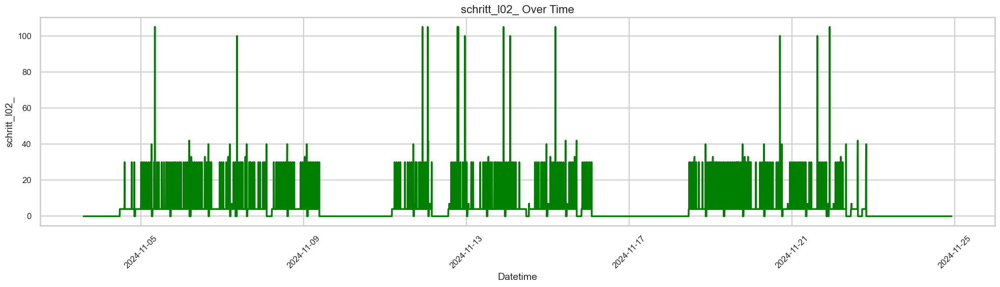

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m01_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m01_,6147.0,4.133055e+06,4.341081e+06,0.0,0.0,0.0,8681590.0,8842022.0,12


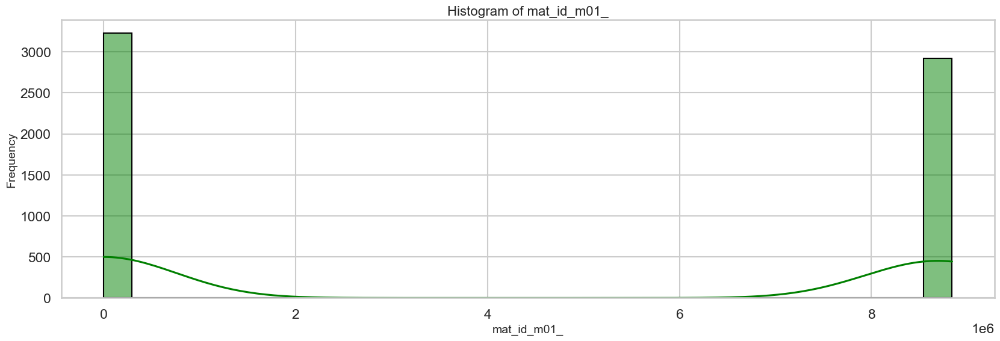

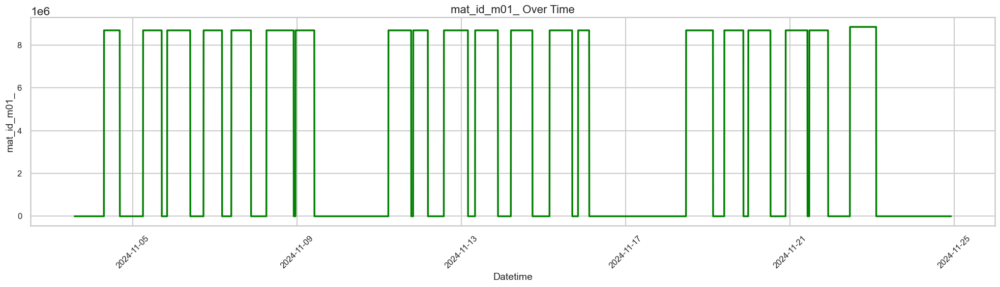

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m02_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m02_,6147.0,3.605681e+06,4.278448e+06,0.0,0.0,0.0,8681590.0,8681697.0,6


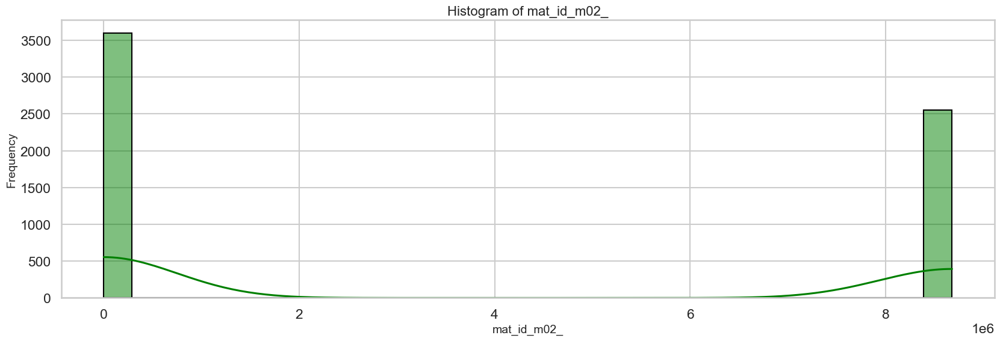

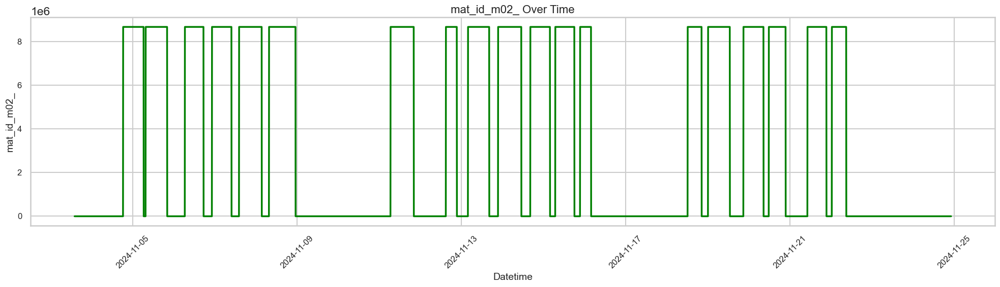

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: mat_id_m03_


,count,mean,std,min,25%,50%,75%,max,unique
mat_id_m03_,6147.0,3.187631e+06,4.185164e+06,0.0,0.0,0.0,8681588.0,8681697.0,5


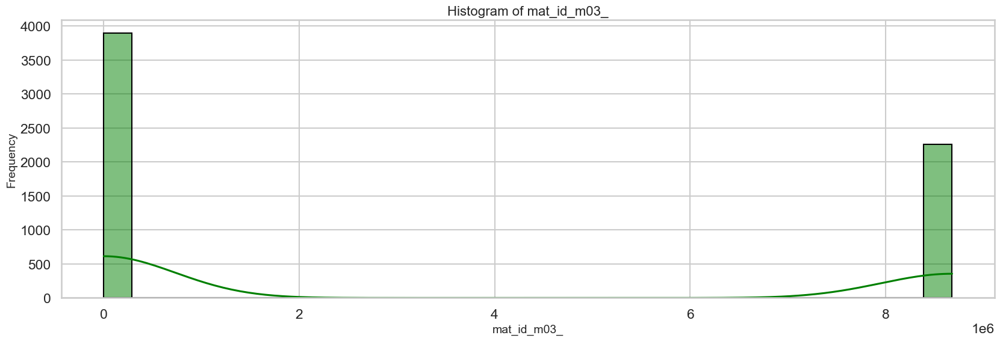

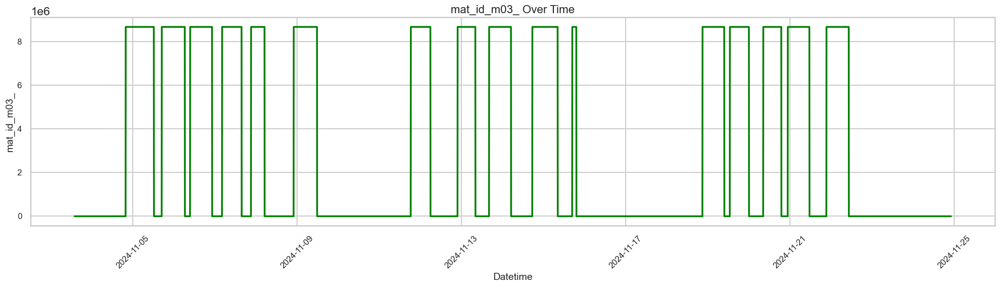

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l01


,count,unique,top,freq
status_name_l01,6147,12,Warten auf Ziel,3209


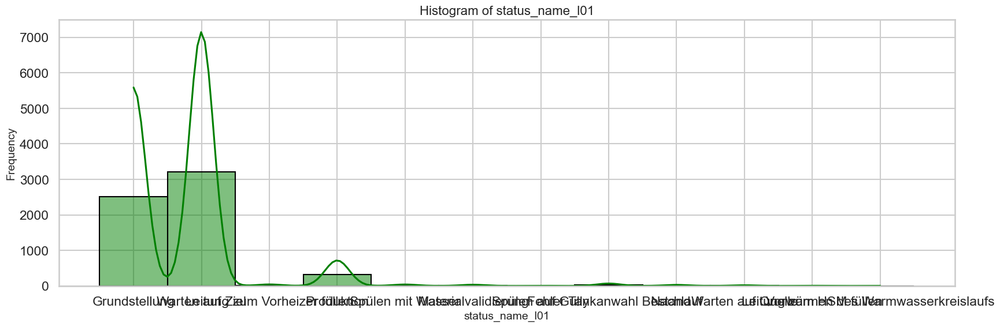

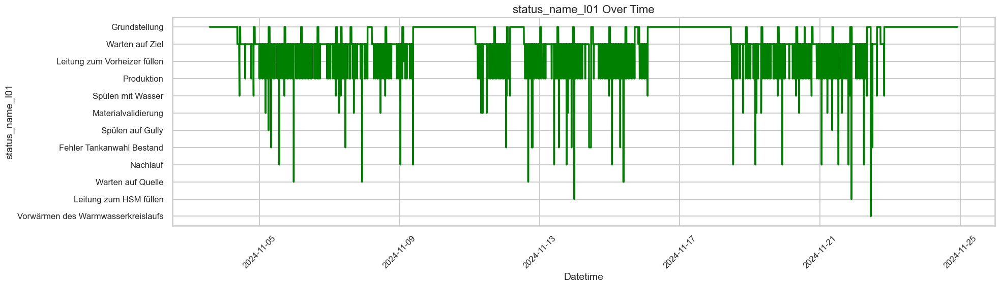

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: status_name_l02


,count,unique,top,freq
status_name_l02,6147,11,Warten auf Ziel,3286


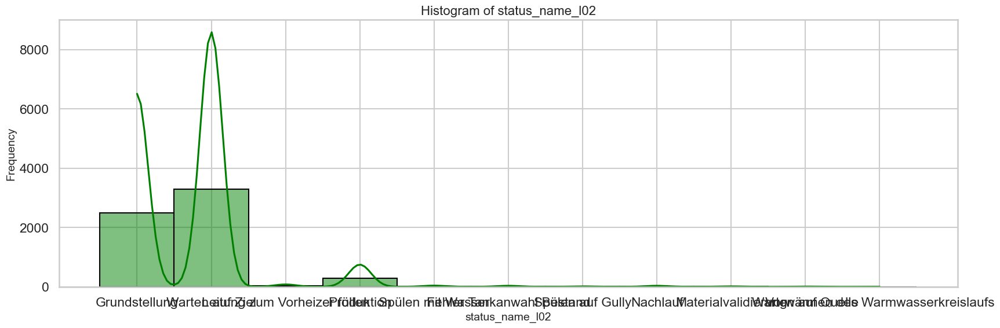

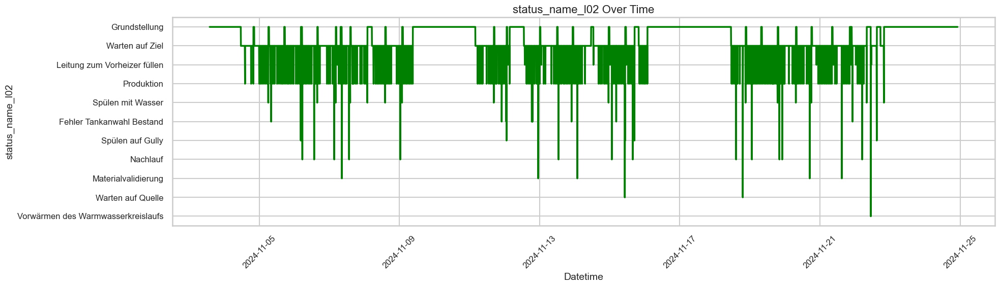

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_menge_l01_kg


,count,mean,std,min,25%,50%,75%,max,unique
pro_menge_l01_kg,6147.0,3300.740286,13478.291445,0.0,0.0,0.0,0.0,118549.606934,610


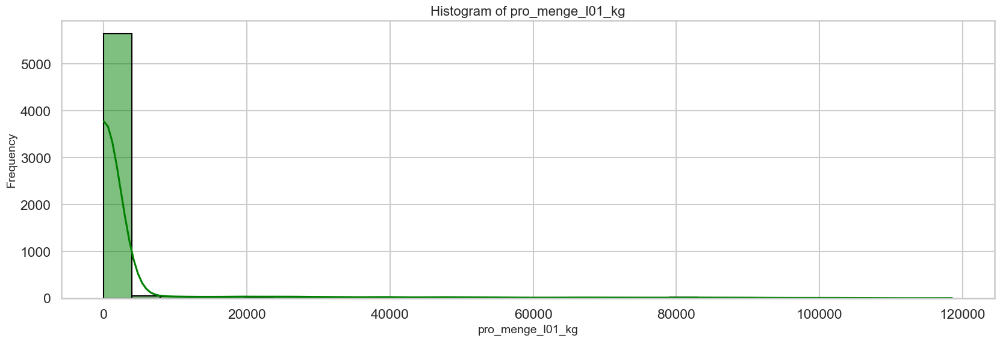

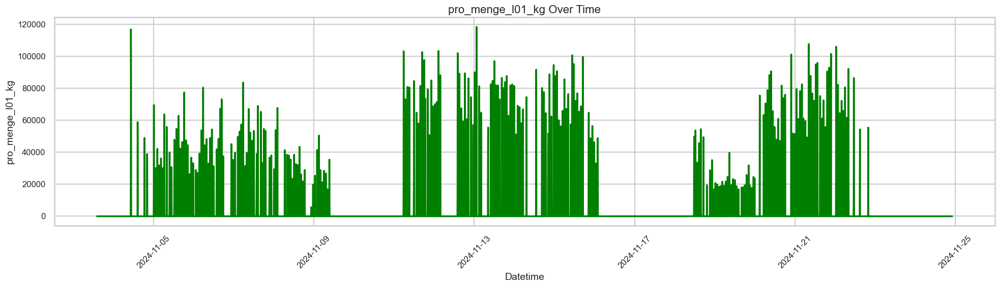

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Variable: pro_menge_l02_kg


,count,mean,std,min,25%,50%,75%,max,unique
pro_menge_l02_kg,6147.0,1806.342653,9224.74813,0.0,0.0,0.0,0.0,153830.052246,549


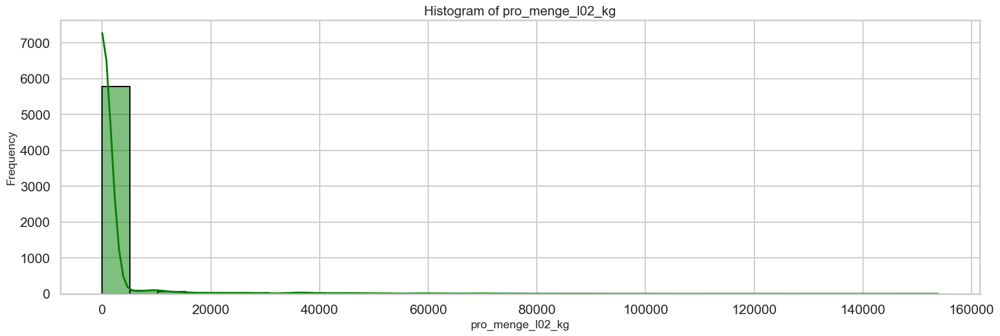

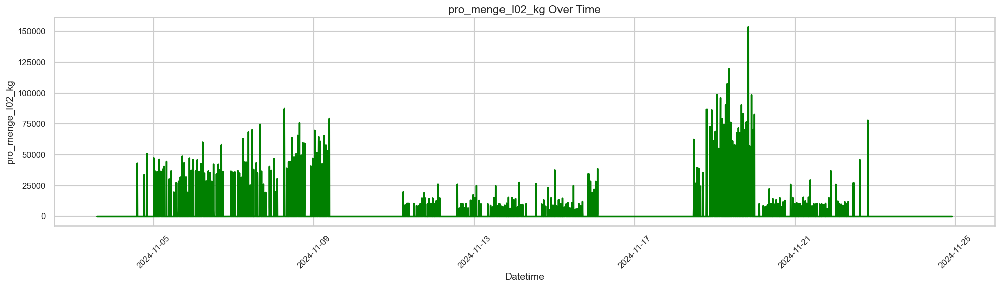

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [54]:


pd.set_option('display.max_rows', 10)
# Display the resampled DataFrame
display(df_resampled_5_min)
visualize_data(df_resampled_5_min, datetime_col="datetime", library="seaborn")

- [Index](#Index)

In [55]:
# Petri net

# df = df_resampled_1H[['datetime','status_name_l01']].reset_index()

# df['index'] = 1

# df = df[['datetime','status_name_l01', 'index']]

# df.columns = ['timestamp' , 'activity', 'case_id']

# event_log = pm4py.format_dataframe(df, case_id='case_id', activity_key='activity', timestamp_key='timestamp')

# #process_tree = pm4py.discover_process_tree_inductive(event_log)

# net2, im2, fm2 = pm4py.discover_petri_net_inductive(event_log)
# #net2, im2, fm2 = pm4py.discover_petri_net_alpha(event_log)
# pm4py.view_petri_net(net2, im2, fm2)

In [56]:
# import pm4py
# import pandas as pd

# # Example dataframe
# process_df = df_resampled_1H[['datetime', 'status_name_l01']].reset_index()

# process_df['index'] = 1  # Add a case ID

# # Format the dataframe for PM4Py
# event_log = pm4py.format_dataframe(process_df, case_id='index', activity_key='status_name_l01', timestamp_key='datetime')

# # Discover the Directly-Follows Graph (DFG)
# dfg, start_activities, end_activities = pm4py.discover_dfg(event_log)

# # Visualize the Directly-Follows Graph (DFG)
# pm4py.view_dfg(dfg, start_activities, end_activities)

# # Now, let's convert this DFG into a Petri net
# # Discover the Petri net using the Alpha Miner
# net, initial_marking, final_marking = pm4py.algo.discovery.alpha.apply(event_log)

# # Visualize the Petri net (states as circles)
# parameters = {pm4py.visualization.petri_net.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"}
# gviz = pm4py.visualization.petri_net.apply(net, initial_marking, final_marking, parameters=parameters)

# # View the Petri net
# pm4py.visualization.petri_net.view(gviz)

In [57]:
# import pm4py
# import pandas as pd

# process_df = df_resampled_1H[['datetime','status_name_l01']].reset_index()

# process_df['index'] = 1

# # Format the dataframe for PM4Py
# event_log = pm4py.format_dataframe(process_df, case_id='index', activity_key='status_name_l01', timestamp_key='datetime')

# # Discover the Directly-Follow Graph (DFG)
# dfg, start_activities, end_activities = pm4py.discover_dfg(event_log)

# # Filter out transitions where the source and target are the same
# dfg_filtered = {key: value for key, value in dfg.items() if key[0] != key[1]}

# # View the filtered DFG
# pm4py.view_dfg(dfg_filtered, start_activities, end_activities)

In [58]:
# import pandas as pd
# from pm4py.objects.conversion.log import converter as log_converter
# from pm4py.algo.discovery.alpha import algorithm as alpha_miner
# from pm4py.visualization.petri_net import visualizer as pn_visualizer
# from pm4py.visualization.petri_net.util import performance_map

# # Example DataFrame (replace with your data)
# data = {
#     'status_name_l01': ['A', 'B', 'A', 'C', 'B', 'A'],
#     'next_state': ['B', 'A', 'C', 'B', 'A', 'B'],
#     'count': [3, 2, 1, 5, 4, 3]  # Replace with your calculated counts
# }

# # Convert data into an event log format
# log_data = []
# for status_name_l01, next_state, count in zip(data['status_name_l01'], data['next_state'], data['count']):
#     for _ in range(count):  # Repeating the transition based on count
#         log_data.append([status_name_l01, next_state])

# # Create a DataFrame for the event log
# log_df = pd.DataFrame(log_data, columns=["concept:name", "next_state"])

# # Convert the DataFrame to an event log
# log = log_converter.apply(log_df)

# # Apply Alpha Miner to discover the Petri net
# net, initial_marking, final_marking = alpha_miner.apply(log)

# # Visualize the Petri net
# parameters = {pn_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"}
# gviz = pn_visualizer.apply(net, initial_marking, final_marking, parameters=parameters)
# pn_visualizer.view(gviz)

In [59]:
# import pandas as pd
# from pm4py.objects.conversion.log import converter as log_converter
# from pm4py.algo.discovery.alpha import algorithm as alpha_miner
# from pm4py.visualization.petri_net import visualizer as pn_visualizer

# data = transition_counts

# # Convert data into an event log format
# log_data = []
# case_id = 1  # Start with a case ID

# for status_name_l01, next_state, count in zip(data['status_name_l01'], data['next_state'], data['count']):
#     for _ in range(count):  # Repeating the transition based on count
#         log_data.append([case_id, status_name_l01, next_state])  # Add case ID
#     case_id += 1  # Increment case ID for each unique case

# # Create a DataFrame for the event log
# log_df = pd.DataFrame(log_data, columns=["case:concept:name", "concept:name", "next_state"])

# # Convert the DataFrame to an event log
# log = log_converter.apply(log_df)

# # Apply Alpha Miner to discover the Petri net
# net, initial_marking, final_marking = alpha_miner.apply(log)

# # Visualize the Petri net
# parameters = {pn_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"}
# gviz = pn_visualizer.apply(net, initial_marking, final_marking, parameters=parameters)
# pn_visualizer.view(gviz)

In [60]:
# import pandas as pd
# from pm4py.objects.conversion.log import converter as log_converter
# from pm4py.algo.discovery.alpha import algorithm as alpha_miner
# from pm4py.visualization.petri_net import visualizer as pn_visualizer

# # Example DataFrame (replace with your data)
# data = {
#     'status_name_l01': ['A', 'B', 'A', 'C', 'B', 'A'],
#     'next_state': ['B', 'A', 'C', 'B', 'A', 'B'],
#     'count': [3, 2, 1, 5, 4, 3]  # Replace with your calculated counts
# }

# # Convert data into an event log format
# log_data = []
# case_id = 1  # Start with a case ID

# for status_name_l01, next_state, count in zip(data['status_name_l01'], data['next_state'], data['count']):
#     for _ in range(count):  # Repeating the transition based on count
#         log_data.append([case_id, status_name_l01, next_state])  # Add case ID
#     case_id += 1  # Increment case ID for each unique case

# # Create a DataFrame for the event log
# log_df = pd.DataFrame(log_data, columns=["case:concept:name", "concept:name", "next_state"])

# # Convert the DataFrame to an event log
# log = log_converter.apply(log_df)

# # Apply Alpha Miner to discover the Petri net
# net, initial_marking, final_marking = alpha_miner.apply(log)

# # Visualize the Petri net
# parameters = {pn_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"}
# gviz = pn_visualizer.apply(net, initial_marking, final_marking, parameters=parameters)
# pn_visualizer.view(gviz)

In [61]:
# import pandas as pd
# from pm4py.objects.conversion.log import converter as log_converter
# from pm4py.algo.discovery.alpha import algorithm as alpha_miner
# from pm4py.visualization.petri_net import visualizer as pn_visualizer

# # Example DataFrame (replace with your data)
# data = {
#     'status_name_l01': ['A', 'B', 'A', 'C', 'B', 'A'],
#     'next_state': ['B', 'A', 'C', 'B', 'A', 'B'],
#     'count': [3, 2, 1, 5, 4, 3]  # Replace with your calculated counts
# }

# # data = transition_counts

# # Convert data into an event log format
# log_data = []

# # Create one case for each flow of transitions
# for case_id, (status_name_l01, next_state, count) in enumerate(zip(data['status_name_l01'], data['next_state'], data['count']), 1):
#     # Add events based on the count
#     for _ in range(count):
#         log_data.append([case_id, status_name_l01])  # Start state for the case
#         log_data.append([case_id, next_state])  # Next state for the case

# # Create a DataFrame for the event log
# log_df = pd.DataFrame(log_data, columns=["case:concept:name", "concept:name"])

# # Convert the DataFrame to an event log
# log = log_converter.apply(log_df)

# # Apply Alpha Miner to discover the Petri net
# net, initial_marking, final_marking = alpha_miner.apply(log)

# # Visualize the Petri net
# parameters = {pn_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"}
# gviz = pn_visualizer.apply(net, initial_marking, final_marking, parameters=parameters)
# pn_visualizer.view(gviz)

- [Index](#Index)